In [115]:
import os
import pandas as pd
import numpy as np
import json
import h5py
from tqdm import tqdm
import argparse
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from models_archs import (TransformerNoduleBimodalClassifier,
                          NoduleClassifier,
                          TransformerNoduleClassifier,
                          save_checkpoint)
from config_manager import load_conf
from train_models import get_label_encoder, prepare_df, PETCTDataset3D

ModuleNotFoundError: No module named 'plotly'

In [112]:
hdf5_path = "../../../Data/PET-CT/lung_radiomics/lung_radiomics_datasets.hdf5"
cfg = load_conf()
modality="pet"
stanford_patients=list(cfg['kfold_patients'][modality]["stanford"][0].values())
santa_maria_patients=list(cfg['kfold_patients'][modality]["santa_maria"][0].values())
kfold_patients=np.concatenate([np.concatenate(stanford_patients),np.concatenate(santa_maria_patients)])
kfold_patients.sort
kfold_patients

NameError: name 'load_conf' is not defined

In [61]:
dataframe={"code":[],"number":[]}
for i in kfold_patients:
    info=i.split("-")
    if len(info)>1:
        dataframe["code"].append(info[0])
        dataframe["number"].append(info[1])

In [64]:
pd.DataFrame(dataframe).sort_values(["code","number"])[0:30]

,code,number
30,AMC,001
0,AMC,006
31,AMC,011
32,AMC,012
1,AMC,013
33,AMC,014
2,AMC,015
34,AMC,016
35,AMC,017
36,AMC,020


# SIN PET LIVER

In [9]:
with h5py.File(hdf5_path, 'r') as h5f:
    img_name="AMC-037_pet"
    print(h5f[img_name]["pet_liver"][()])
    #slices = [int(k) for k in h5f[img_name]['img_exam'].keys()]
    #slices.sort()

[12438 14021 12985 ... 11382 11866 10910]


In [141]:
msm=[]
mamc=[]
mr01=[]
for name in kfold_patients:
    with h5py.File(hdf5_path, 'r') as h5f:
        img_name=name+"_"+modality
        slices = [int(k) for k in h5f[img_name]['img_exam'].keys()]
        slices.sort()
        for slice in slices:
            if name[:2]=="sm":
                img=h5f[img_name]['img_exam'][str(slice)][()]
                msm.append(np.mean(img))
            
            if name[:3]=="AMC":
                img=h5f[img_name]['img_exam'][str(slice)][()]
                mamc.append(np.mean(img))
            
            if name[:3]=="R01":
                img=h5f[img_name]['img_exam'][str(slice)][()]
                mr01.append(np.mean(img))
mean={}
mean["sm"] = np.mean(msm, axis=0) 
mean["AMC"] = np.mean(mamc, axis=0) 
mean["R01"] = np.mean(mr01, axis=0) 

final_data={"dataset":[],"name":[],"slice":[],"std":[]}
for name in kfold_patients:
    with h5py.File(hdf5_path, 'r') as h5f:
        img_name=name+"_"+modality
        slices = [int(k) for k in h5f[img_name]['img_exam'].keys()]
        slices.sort()
        for slice in slices:
            if name[:2]=="sm":
                final_data["dataset"].append("sm")
                mu=mean["sm"]
            elif name[:3]=="AMC":
                final_data["dataset"].append(name[:3])
                mu=mean["AMC"]
            else:
                final_data["dataset"].append(name[:3])
                mu=mean["R01"]
            final_data["name"].append(name)
            final_data["slice"].append(slice)
            img=h5f[img_name]['img_exam'][str(slice)][()]
            var = np.mean((img - mu) ** 2)
            final_data["std"].append(var)


In [142]:
dataset=pd.DataFrame(final_data)
dataset[dataset["dataset"]=="R01"]

,dataset,name,slice,std
46,R01,R01-009,0,2.511939e+06
47,R01,R01-009,1,2.367670e+06
48,R01,R01-009,2,2.186702e+06
49,R01,R01-009,3,1.957911e+06
50,R01,R01-018,0,6.764523e+06
...,...,...,...,...
1390,R01,R01-162,9,1.391675e+06
1391,R01,R01-162,10,1.318193e+06
1392,R01,R01-162,11,1.199657e+06
1393,R01,R01-162,12,1.181190e+06


In [146]:
data_process={"pet_liver":[],"dataset":[],"mean":[],"std":[]}
dataset=pd.DataFrame(final_data)
for i in ["AMC","R01","sm"]: 
    group_data=dataset[dataset["dataset"]==i]
    data_process["pet_liver"].append("False")
    data_process["dataset"].append(i)
    data_process["mean"].append(mean[i])
    data_process["std"].append(np.sqrt(np.mean(group_data["std"], axis=0)))
    print(i, "mean" ,mean[i], "std", np.sqrt(np.mean(group_data["std"], axis=0))  )

AMC mean 540.8833159872362 std 1852.7848099331911
R01 mean 215.90440860630324 std 2172.543741865578
sm mean 593.8262621192814 std 1669.2827838505696


In [148]:
data={"dataset":["AMC","R01","sm"],"mean":[540.88,215.90,593.82],"std":[1852.78,2172.54,1669.28]}
dataframe_process=pd.DataFrame(data)
dataframe_process

,dataset,mean,std
0,AMC,540.88,1852.78
1,R01,215.90,2172.54
2,sm,593.82,1669.28


In [150]:
for name in kfold_patients:
    with h5py.File(hdf5_path, 'r') as h5f:
        img_name=name+"_"+modality
        slices = [int(k) for k in h5f[img_name]['img_exam'].keys()]
        slices.sort()
        for slice in slices:
            if name[:2]=="sm":
                dataset=name[:2]
            else:
                dataset=name[:3]
            info_pre=dataframe_process[dataframe_process["dataset"]==dataset]
            mean=float(info_pre["mean"])
            std=float(info_pre["std"]) 
            img=h5f[img_name]['img_exam'][str(slice)][()]
            img_post=(np.array(img)-mean)/std
            print(dataset,name,np.min(img_post),np.mean(img_post),np.max(img_post))
            

/tmp/ipykernel_20981/391128917.py:12: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mean=float(info_pre["mean"])
/tmp/ipykernel_20981/391128917.py:13: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  std=float(info_pre["std"])


AMC AMC-006 -0.2919288852427164 0.32107372282082536 10.879392048705189
AMC AMC-006 -0.2919288852427164 0.32449631405872187 28.024438951197663
AMC AMC-006 -0.2919288852427164 0.3255612783454964 52.120122194755986
AMC AMC-006 -0.2919288852427164 0.33141762659102136 53.74362849339911
AMC AMC-006 -0.2919288852427164 0.3176330461649184 42.87725471993437
AMC AMC-006 -0.2919288852427164 0.29711037924471945 19.151286175368906
AMC AMC-013 -0.2919288852427164 -0.041696435535572084 5.724435712820735
AMC AMC-013 -0.2919288852427164 -0.04304340203752382 5.3207180561102785
AMC AMC-013 -0.2919288852427164 -0.0400916685557199 5.865844838566911
AMC AMC-013 -0.2919288852427164 -0.040346701865837345 8.140804628720087
AMC AMC-013 -0.2919288852427164 -0.041615836283479715 12.407905957534084
AMC AMC-013 -0.2919288852427164 -0.04684857984334502 15.140016623668217
AMC AMC-013 -0.2919288852427164 -0.05416128190457193 13.572102462245923
AMC AMC-013 -0.2919288852427164 -0.0636535751484481 8.571508759809584
AMC A

In [140]:
for name in kfold_patients:
    with h5py.File(hdf5_path, 'r') as h5f:
        img_name=name+"_"+modality
        slices = [int(k) for k in h5f[img_name]['img_exam'].keys()]
        slices.sort()
        for slice in slices:
            if name[:2]=="sm":
                dataset=name[:2]
            else:
                dataset=name[:3]
            info_pre=dataframe_process[dataframe_process["dataset"]==dataset]
            mean=float(info_pre["mean"])
            std=float(info_pre["std"]) 
            img=h5f[img_name]['img_exam'][str(slice)][()]
            img_post=(np.array(img)-mean)/std
            print(dataset,np.min(img_post),np.max(img_post))

/tmp/ipykernel_20981/969627638.py:12: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mean=float(info_pre["mean"])
/tmp/ipykernel_20981/969627638.py:13: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  std=float(info_pre["std"])


AMC -0.2919288852427164 10.879392048705189
AMC -0.2919288852427164 28.024438951197663
AMC -0.2919288852427164 52.120122194755986
AMC -0.2919288852427164 53.74362849339911
AMC -0.2919288852427164 42.87725471993437
AMC -0.2919288852427164 19.151286175368906
AMC -0.2919288852427164 5.724435712820735
AMC -0.2919288852427164 5.3207180561102785
AMC -0.2919288852427164 5.865844838566911
AMC -0.2919288852427164 8.140804628720087
AMC -0.2919288852427164 12.407905957534084
AMC -0.2919288852427164 15.140016623668217
AMC -0.2919288852427164 13.572102462245923
AMC -0.2919288852427164 8.571508759809584
AMC -0.2919288852427164 8.100324917151525
AMC -0.2919288852427164 7.111000766415873
AMC -0.2919288852427164 4.147346150109565
AMC -0.2919288852427164 4.193223156553935
AMC -0.2919288852427164 4.314662291259621
AMC -0.2919288852427164 6.431481341551615
AMC -0.2919288852427164 8.213668109543498
AMC -0.2919288852427164 6.606893425015383
AMC -0.2919288852427164 3.9794902794719285
AMC -0.2919288852427164 5

# CON PET LIVER

In [157]:
msm=[]
mamc=[]
mr01=[]
for name in kfold_patients:
    with h5py.File(hdf5_path, 'r') as h5f:
        img_name=name+"_"+modality
        slices = [int(k) for k in h5f[img_name]['img_exam'].keys()]
        slices.sort()
        for slice in slices:
            if name[:2]=="sm":
                img=h5f[img_name]['img_exam'][str(slice)][()]
                pet_liver = h5f[f'{img_name}/pet_liver'][()]
                pet_liver_mean = pet_liver[pet_liver != 0].mean() + 1e-10
                img = img / pet_liver_mean
                msm.append(np.mean(img))
            
            if name[:3]=="AMC":
                img=h5f[img_name]['img_exam'][str(slice)][()]
                pet_liver = h5f[f'{img_name}/pet_liver'][()]
                pet_liver_mean = pet_liver[pet_liver != 0].mean() + 1e-10
                img = img / pet_liver_mean
                mamc.append(np.mean(img))
            
            if name[:3]=="R01":
                img=h5f[img_name]['img_exam'][str(slice)][()]
                pet_liver = h5f[f'{img_name}/pet_liver'][()]
                pet_liver_mean = pet_liver[pet_liver != 0].mean() + 1e-10
                img = img / pet_liver_mean
                mr01.append(np.mean(img))
mean={}
mean["sm"] = np.mean(msm, axis=0) 
mean["AMC"] = np.mean(mamc, axis=0) 
mean["R01"] = np.mean(mr01, axis=0) 

final_data={"dataset":[],"name":[],"slice":[],"std":[]}
for name in kfold_patients:
    with h5py.File(hdf5_path, 'r') as h5f:
        img_name=name+"_"+modality
        slices = [int(k) for k in h5f[img_name]['img_exam'].keys()]
        slices.sort()
        for slice in slices:
            if name[:2]=="sm":
                final_data["dataset"].append("sm")
                mu=mean["sm"]
            elif name[:3]=="AMC":
                final_data["dataset"].append(name[:3])
                mu=mean["AMC"]
            else:
                final_data["dataset"].append(name[:3])
                mu=mean["R01"]
            final_data["name"].append(name)
            final_data["slice"].append(slice)
            img=h5f[img_name]['img_exam'][str(slice)][()]
            pet_liver = h5f[f'{img_name}/pet_liver'][()]
            pet_liver_mean = pet_liver[pet_liver != 0].mean() + 1e-10
            
            print(pet_liver_mean)
            
            img = img / pet_liver_mean
            var = np.mean((img - mu) ** 2)
            final_data["std"].append(var)


17451.414540816426
17451.414540816426
17451.414540816426
17451.414540816426
17451.414540816426
17451.414540816426
10969.024234693978
10969.024234693978
10969.024234693978
10969.024234693978
10969.024234693978
10969.024234693978
10969.024234693978
10969.024234693978
10969.024234693978
10969.024234693978
7276.947704081733
7276.947704081733
7276.947704081733
7276.947704081733
7276.947704081733
7276.947704081733
7276.947704081733
8589.748724489897
8589.748724489897
8589.748724489897
8589.748724489897
8589.748724489897
8589.748724489897
8589.748724489897
8589.748724489897
8589.748724489897
12368.815873015974
12368.815873015974
12368.815873015974
12368.815873015974
12368.815873015974
12368.815873015974
23984.0012755103
23984.0012755103
23984.0012755103
23984.0012755103
23984.0012755103
23984.0012755103
23984.0012755103
23984.0012755103
-5177.242326332695
-5177.242326332695
-5177.242326332695
-5177.242326332695
-10110.906300484552
-10110.906300484552
-10110.906300484552
-10110.906300484552
-1

In [153]:
dataset=pd.DataFrame(final_data)
for i in ["AMC","R01","sm"]: 
    group_data=dataset[dataset["dataset"]==i]
    data_process["pet_liver"].append("True")
    data_process["dataset"].append(i)
    data_process["mean"].append(mean[i])
    data_process["std"].append(np.sqrt(np.mean(group_data["std"], axis=0)))
    print(i, "mean" ,mean[i], "std", np.sqrt(np.mean(group_data["std"], axis=0))  )

AMC mean 0.05673112987744073 std 0.1787675156641195
R01 mean 0.07192847916012629 std 0.27140073807056625
sm mean 0.07198187010834566 std 0.20039018576710288


In [165]:
data_process

{'pet_liver': ['False', 'False', 'False', 'True', 'True', 'True'],
 'dataset': ['AMC', 'R01', 'sm', 'AMC', 'R01', 'sm'],
 'mean': [540.8833159872362,
  215.90440860630324,
  593.8262621192814,
  0.05673112987744073,
  0.07192847916012629,
  0.07198187010834566],
 'std': [1852.7848099331911,
  2172.543741865578,
  1669.2827838505696,
  0.1787675156641195,
  0.27140073807056625,
  0.20039018576710288]}

In [169]:
for name in kfold_patients:
    with h5py.File(hdf5_path, 'r') as h5f:
        img_name=name+"_"+modality
        slices = [int(k) for k in h5f[img_name]['img_exam'].keys()]
        slices.sort()
        for slice in slices:
            if name[:2]=="sm":
                dataset=name[:2]
            else:
                dataset=name[:3]
            process=dataframe_process[dataframe_process["pet_liver"]=="True"]
            info_pre=process[process["dataset"]==dataset]
            mean=float(info_pre["mean"])
            std=float(info_pre["std"]) 
            img=h5f[img_name]['img_exam'][str(slice)][()]
            pet_liver = h5f[f'{img_name}/pet_liver'][()]
            pet_liver_mean = pet_liver[pet_liver != 0].mean() + 1e-10
            img = img / pet_liver_mean
            img_post=(np.array(img)-mean)/std
            print(dataset,np.min(img),np.max(img),"mean",mean)

/tmp/ipykernel_20981/1791896971.py:13: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  mean=float(info_pre["mean"])
/tmp/ipykernel_20981/1791896971.py:14: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  std=float(info_pre["std"])


AMC 0.0 1.1860356621287211 mean 0.05673112987744073
AMC 0.0 3.0062892539337724 mean 0.05673112987744073
AMC 0.0 5.564477296260307 mean 0.05673112987744073
AMC 0.0 5.736841547477004 mean 0.05673112987744073
AMC 0.0 4.583181484396632 mean 0.05673112987744073
AMC 0.0 2.0642452745446445 mean 0.05673112987744073
AMC 0.0 1.016225305140917 mean 0.05673112987744073
AMC 0.0 0.9480332778469898 mean 0.05673112987744073
AMC 0.0 1.0401107478561695 mean 0.05673112987744073
AMC 0.0 1.4243746449736867 mean 0.05673112987744073
AMC 0.0 2.1451315537782163 mean 0.05673112987744073
AMC 0.0 2.606612893566798 mean 0.05673112987744073
AMC 0.0 2.3417762100255435 mean 0.05673112987744073
AMC 0.0 1.4971249628621277 mean 0.05673112987744073
AMC 0.0 1.417537209081916 mean 0.05673112987744073
AMC 0.0 1.2504302758870383 mean 0.05673112987744073
AMC 0.0 1.1302815870707017 mean 0.05673112987744073
AMC 0.0 1.1419623086392134 mean 0.05673112987744073
AMC 0.0 1.172881865732333 mean 0.05673112987744073
AMC 0.0 1.711844100

In [166]:
dataframe_process=pd.DataFrame(data_process)
dataframe_process

,pet_liver,dataset,mean,std
0,False,AMC,540.883316,1852.784810
1,False,R01,215.904409,2172.543742
2,False,sm,593.826262,1669.282784
3,True,AMC,0.056731,0.178768
4,True,R01,0.071928,0.271401
5,True,sm,0.071982,0.200390


In [177]:
ls ../../../Data/PET-CT/lung_radiomics/process_info.csv

data/  lung_radiomics/


In [178]:
dataframe_process.to_csv("../../../Data/PET-CT/lung_radiomics/process_info.csv")

## OTRO

In [111]:


arg_dataset="stanford"
kfold=0

testing_patients = cfg['kfold_patients'][modality_b][arg_dataset][kfold]['test']
df_path = os.path.join('../../../Data/PET-CT/data', 'features_no_petliver', 'petct.parquet')

modality_a="pet"
modality_b="ct"
df = pd.read_parquet(df_path)
df['flip'] = df['flip'].astype(str)
df.reset_index(drop=True, inplace=True)
df = prepare_df(df, modality_a, modality_b)
df_test = df[df['patient_id'].isin(testing_patients)]
df_test.reset_index(drop=True, inplace=True)

EGFR_encoder = get_label_encoder(df)

hdf5_pet_path = os.path.join('../../../Data/PET-CT/data', 'features_no_petliver', f'features_masks_{modality_a}.hdf5')
hdf5_ct_path = os.path.join('../../../Data/PET-CT/data', 'features_no_petliver', f'features_masks_{modality_b}.hdf5')

NameError: name 'cfg' is not defined

In [11]:
label_encoder=EGFR_encoder
hdf5_ct_path=hdf5_ct_path
hdf5_pet_path=hdf5_pet_path
use_augmentation=False
feature_dim=256
arch="transformer"



test_dataset = PETCTDataset3D(df_test,
                              label_encoder=EGFR_encoder,
                              hdf5_ct_path=hdf5_ct_path,
                              hdf5_pet_path=hdf5_pet_path,
                              modality_a=modality_a,
                              modality_b=modality_b,
                              use_augmentation=False,
                              feature_dim=feature_dim,
                              arch=arch)

In [ ]:
inn=0
for i in test_dataset:
    for j in range(2):
        ll=np.array(i[j])
        for k in ll:
            print(len(k))
            contains_nan = np.isnan(ll).any()
            print("Array contains NaN:", contains_nan)
            #print(ll[0])
            inn+=1
print(inn)

256
Array contains NaN: False
256
Array contains NaN: False
256
Array contains NaN: False
256
Array contains NaN: False
256
Array contains NaN: False
256
Array contains NaN: False
256
Array contains NaN: False
256
Array contains NaN: False
256
Array contains NaN: False
256
Array contains NaN: False
256
Array contains NaN: False
256
Array contains NaN: False
256
Array contains NaN: False
256
Array contains NaN: False
256
Array contains NaN: False
256
Array contains NaN: False
256
Array contains NaN: False
256
Array contains NaN: False
256
Array contains NaN: False
256
Array contains NaN: False
256
Array contains NaN: False
256
Array contains NaN: False
256
Array contains NaN: False
256
Array contains NaN: False
256
Array contains NaN: False
256
Array contains NaN: False
256
Array contains NaN: False
256
Array contains NaN: False
256
Array contains NaN: False
256
Array contains NaN: False
256
Array contains NaN: False
256
Array contains NaN: False
256
Array contains NaN: False
256
Array 

In [ ]:
import numpy

In [24]:
ls ../../../../shared_data/NSCLC_Radiogenomics/Liver_ROI/R01-107_pet_liver.nrrd

AMC-001_pet_liver.nrrd*  R01-029_pet_liver.nrrd*  R01-095_pet_liver.nrrd*
AMC-003_pet_liver.nrrd*  R01-030_pet_liver.nrrd*  R01-096_pet_liver.nrrd*
AMC-004_pet_liver.nrrd*  R01-031_pet_liver.nrrd*  R01-097_pet_liver.nrrd*
AMC-006_pet_liver.nrrd*  R01-032_pet_liver.nrrd*  R01-098_pet_liver.nrrd*
AMC-009_pet_liver.nrrd*  R01-033_pet_liver.nrrd*  R01-099_pet_liver.nrrd*
AMC-010_pet_liver.nrrd*  R01-034_pet_liver.nrrd*  R01-100_pet_liver.nrrd*
AMC-011_pet_liver.nrrd*  R01-035_pet_liver.nrrd*  R01-101_pet_liver.nrrd*
AMC-012_pet_liver.nrrd*  R01-036_pet_liver.nrrd*  R01-102_pet_liver.nrrd*
AMC-013_pet_liver.nrrd*  R01-037_pet_liver.nrrd*  R01-103_pet_liver.nrrd*
AMC-014_pet_liver.nrrd*  R01-038_pet_liver.nrrd*  R01-104_pet_liver.nrrd*
AMC-015_pet_liver.nrrd*  R01-039_pet_liver.nrrd*  R01-105_pet_liver.nrrd*
AMC-016_pet_liver.nrrd*  R01-040_pet_liver.nrrd*  R01-106_pet_liver.nrrd*
AMC-017_pet_liver.nrrd*  R01-041_pet_liver.nrrd*  R01-107_pet_liver.nrrd*
AMC-020_pet_liver.nrrd*  R01-042_pet_l

In [9]:
import nrrd


ModuleNotFoundError: No module named 'nrrd'

In [10]:
pip install git+https://github.com/mhe/pynrrd.git


  Cloning https://github.com/mhe/pynrrd.git to /tmp/pip-req-build-a3ap2in6
  Running command git clone --filter=blob:none --quiet https://github.com/mhe/pynrrd.git /tmp/pip-req-build-a3ap2in6
  Resolved https://github.com/mhe/pynrrd.git to commit 96bf87b78bde03987c09346ceffe0bb85a8f4214
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for pynrrd: filename=pynrrd-1.1.3-py3-none-any.whl size=23544 sha256=23d69d988b22092ef4e6c55f3f914202c4fd5f8f80db36343e095114b3a21d1f
  Stored in directory: /tmp/pip-ephem-wheel-cache-nodznnuw/wheels/0a/6a/aa/8167cf448d736b2ade3aeb53eebc105655818ad5e29e3d024b
Successfully built pynrrd
Note: you may need to restart the kernel to use updated packages.


In [49]:
name="AMC-017"
img_pet_ot, header = nrrd.read(f"../../../Data/{name}/pet/{name}_pet_image.nrrd")
msk_pet_ot, header = nrrd.read(f"../../../Data/{name}/pet/{name}_pet_segmentation.nrrd")


1290.6567 3204.3535 0.0 26322.49
778.7413 3851.0828 0.0 486468.72


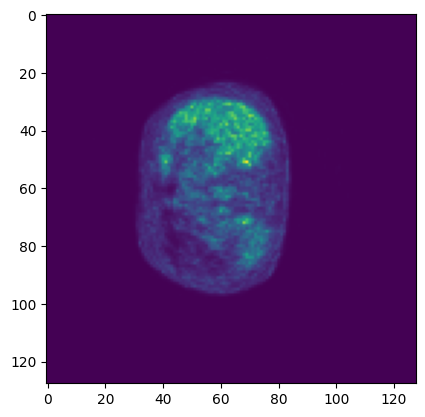

In [47]:
xdx=img_pet[:,:,138]
plt.imshow(xdx)
print(np.mean(xdx),np.std(xdx),np.min(xdx),np.max(xdx))
print(np.mean(img_pet),np.std(img_pet),np.min(img_pet),np.max(img_pet))

In [52]:
np.allclose(img_pet,img_pet_ot)

False

In [48]:
import numpy as np
import matplotlib.pyplot as plt
import nrrd
import h5py
name="AMC-017"

#img_pet, header = nrrd.read(f"../../../Data/{name}/pet/{name}_pet_image.nrrd")
#msk_pet, header = nrrd.read(f"../../../Data/{name}/pet/{name}_pet_segmentation.nrrd")
img_pet, header = nrrd.read(f"../../../../shared_data/NSCLC_Radiogenomics/images/{name}/pet/{name}_pet_image.nrrd")
msk_pet, header = nrrd.read(f"../../../../shared_data/NSCLC_Radiogenomics/images/{name}/pet/{name}_pet_segmentation.nrrd")

pet_liver, header = nrrd.read(f"../../../../shared_data/NSCLC_Radiogenomics/Liver_ROI/{name}_pet_liver.nrrd")

liver_roi=[]
for i in range(pet_liver.shape[2]):
    pet_liver_slice=pet_liver[:,:,i]
    if np.sum(pet_liver_slice)>0:
        print(i)
        point_liver=pet_liver_slice*img_pet[:,:,i]
        liver_roi.append(point_liver)


144
145
146
147
148
149
150
151
152
153
154


In [41]:
liver_roi

[array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]], dtype=float32),
 array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]], dtype=float32),
 array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]], dtype=float32),
 array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],


1290.6567 3204.3535 0.0 26322.49
778.7413 3851.0828 0.0 486468.72


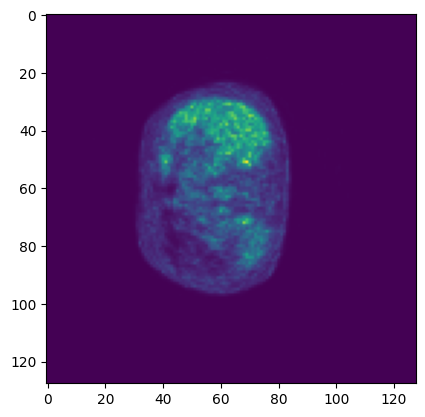

In [35]:
xdx=img_pet[:,:,138]
plt.imshow(xdx)
print(np.mean(xdx),np.std(xdx),np.min(xdx),np.max(xdx))
print(np.mean(img_pet),np.std(img_pet),np.min(img_pet),np.max(img_pet))

In [65]:
ls ../../../../shared_data/NSCLC_Radiogenomics/images/

AMC-001/  R01-005/  R01-028/  R01-051/  R01-074/  R01-097/  R01-120/  R01-143/
AMC-002/  R01-006/  R01-029/  R01-052/  R01-075/  R01-098/  R01-121/  R01-144/
AMC-003/  R01-007/  R01-030/  R01-053/  R01-076/  R01-099/  R01-122/  R01-145/
AMC-004/  R01-008/  R01-031/  R01-054/  R01-077/  R01-100/  R01-123/  R01-146/
AMC-005/  R01-009/  R01-032/  R01-055/  R01-078/  R01-101/  R01-124/  R01-147/
AMC-006/  R01-010/  R01-033/  R01-056/  R01-079/  R01-102/  R01-125/  R01-148/
AMC-007/  R01-011/  R01-034/  R01-057/  R01-080/  R01-103/  R01-126/  R01-149/
AMC-008/  R01-012/  R01-035/  R01-058/  R01-081/  R01-104/  R01-127/  R01-150/
AMC-009/  R01-013/  R01-036/  R01-059/  R01-082/  R01-105/  R01-128/  R01-151/
AMC-010/  R01-014/  R01-037/  R01-060/  R01-083/  R01-106/  R01-129/  R01-152/
AMC-011/  R01-015/  R01-038/  R01-061/  R01-084/  R01-107/  R01-130/  R01-153/
AMC-012/  R01-016/  R01-039/  R01-062/  R01-085/  R01-108/  R01-131/  R01-156/
AMC-013/  R01-017/  R01-040/  R01-063/  R01-086/  R0

In [10]:
name="AMC-037"
img_pet, header = nrrd.read(f"../../../../shared_data/NSCLC_Radiogenomics/images/{name}/pet/{name}_pet_image.nrrd")
msk_pet, header = nrrd.read(f"../../../../shared_data/NSCLC_Radiogenomics/images/{name}/pet/{name}_pet_segmentation.nrrd")

NameError: name 'nrrd' is not defined

In [83]:
pet_liver, header = nrrd.read(f"../../../../shared_data/NSCLC_Radiogenomics/Liver_ROI/{name}_pet_liver.nrrd")

In [84]:
liver_roi=[]
for i in range(readdata.shape[1]):
    if np.sum(pet_liver[:,:,i])>0:
        point_liver=pet_liver[:,:,i]*img_pet[:,:,i]
        liver_roi.append(point_liver)

In [42]:
values=np.unique(liver_roi,return_counts=True)[0][1:]
counts=np.unique(liver_roi,return_counts=True)[1][1:]
print(np.sum(values.astype(int)*counts)/np.sum(counts))

12048.51376146789


In [44]:
print(name)
hdf5_path = "../../../Data/PET-CT/lung_radiomics/lung_radiomics_datasets.hdf5"
with h5py.File(hdf5_path, 'r') as h5f:
    img_name=f"{name}_pet"
    ll_load=h5f[img_name]["pet_liver"][()]
    print(np.mean(ll_load))
    print(len(ll_load))
    print(ll_load)

AMC-037
12048.51376146789
1308
[12438 14021 12985 ... 11382 11866 10910]


In [ ]:
hdf5_path = "../../../Data/PET-CT/lung_radiomics/lung_radiomics_datasets.hdf5"
for name in kfold_patients:
    with h5py.File(hdf5_path, 'r') as h5f:
        img_name=name+"_"+modality
        slices = [int(k) for k in h5f[img_name]['img_exam'].keys()]
        slices.sort()
        for slice in slices:
            if name[:2]=="sm":
                dataset=name[:2]
            else:
                dataset=name[:3]
            info_pre=dataframe_process[dataframe_process["dataset"]==dataset]
            mean=float(info_pre["mean"])
            std=float(info_pre["std"]) 
            img=h5f[img_name]['img_exam'][str(slice)][()]
            img_post=(np.array(img)-mean)/std
            print(dataset,name,np.min(img_post),np.mean(img_post),np.max(img_post))
            

# SWIN 3D

In [168]:
from swin3d.swin3d import swin_3D
from swin3d.head import iBOTHead
from swin3d.utiles import MultiCropWrapper
import pandas as pd
import torch

In [169]:
ls ../../../../shared_data/PET-CT/weights/ct_stanford/checkpoint.pth

../../../../shared_data/PET-CT/weights/ct_stanford/checkpoint.pth*


In [176]:
model3d=swin_3D()#return_all_tokens=True)#,masked_im_modeling=True)
"""
embed_dim = model3d.num_features
out_dim=8192
patch_out_dim=8192
norm_in_head=None
act_in_head="gelu"
norm_last_layer=True
shared_head=True


model3d = MultiCropWrapper(model3d, iBOTHead(
        embed_dim,
        out_dim,
        patch_out_dim=patch_out_dim,
        norm=norm_in_head,
        act=act_in_head,
        norm_last_layer=norm_last_layer,
        shared_head=shared_head,
    ))
"""

'\nembed_dim = model3d.num_features\nout_dim=8192\npatch_out_dim=8192\nnorm_in_head=None\nact_in_head="gelu"\nnorm_last_layer=True\nshared_head=True\n\n\nmodel3d = MultiCropWrapper(model3d, iBOTHead(\n        embed_dim,\n        out_dim,\n        patch_out_dim=patch_out_dim,\n        norm=norm_in_head,\n        act=act_in_head,\n        norm_last_layer=norm_last_layer,\n        shared_head=shared_head,\n    ))\n'

In [177]:
pesos=torch.load("../../../../shared_data/PET-CT/weights/ct_stanford/checkpoint.pth", weights_only=False,map_location="cpu")


In [178]:
pesos_corrected = {}

for key in pesos["teacher"]:
    # remove the module. part
    #print(key[9:])
    pesos_corrected[key[9:]] = pesos["teacher"][key]
    

In [179]:
model3d.load_state_dict(pesos_corrected,strict=False) #pesos_corrected

_IncompatibleKeys(missing_keys=[], unexpected_keys=['0.weight', '0.bias', '2.weight', '2.bias', '4.weight', '4.bias', '_layer.weight_g', '_layer.weight_v', '_layer2.weight_g', '_layer2.weight_v'])

In [180]:
mmdd=model3d.to("cuda:1").eval()

In [181]:
mmdd.state_dict()

OrderedDict([('patch_embed.proj.weight',
              tensor([[[[[-0.0028,  0.0646, -0.1027, -0.0917],
                         [-0.0493,  0.0317, -0.0034,  0.0970],
                         [-0.0126,  0.0314, -0.0382, -0.0252],
                         [-0.1194, -0.0828, -0.0517,  0.0035]],
              
                        [[ 0.0467,  0.0723, -0.0849, -0.0548],
                         [ 0.0429,  0.1010, -0.0265,  0.0913],
                         [-0.0217,  0.0117,  0.1107, -0.1156],
                         [-0.0794, -0.0325, -0.0492,  0.1054]],
              
                        [[-0.0822, -0.0587, -0.0876, -0.1169],
                         [-0.0742,  0.1043,  0.0537,  0.0586],
                         [ 0.0044, -0.0649,  0.0195, -0.1166],
                         [-0.0912, -0.0652,  0.0765,  0.0709]],
              
                        [[-0.0572, -0.0066,  0.0772,  0.1211],
                         [ 0.0466,  0.0147,  0.0812, -0.0741],
                         [ 0.

In [182]:
model3d.state_dict()

OrderedDict([('patch_embed.proj.weight',
              tensor([[[[[-0.0028,  0.0646, -0.1027, -0.0917],
                         [-0.0493,  0.0317, -0.0034,  0.0970],
                         [-0.0126,  0.0314, -0.0382, -0.0252],
                         [-0.1194, -0.0828, -0.0517,  0.0035]],
              
                        [[ 0.0467,  0.0723, -0.0849, -0.0548],
                         [ 0.0429,  0.1010, -0.0265,  0.0913],
                         [-0.0217,  0.0117,  0.1107, -0.1156],
                         [-0.0794, -0.0325, -0.0492,  0.1054]],
              
                        [[-0.0822, -0.0587, -0.0876, -0.1169],
                         [-0.0742,  0.1043,  0.0537,  0.0586],
                         [ 0.0044, -0.0649,  0.0195, -0.1166],
                         [-0.0912, -0.0652,  0.0765,  0.0709]],
              
                        [[-0.0572, -0.0066,  0.0772,  0.1211],
                         [ 0.0466,  0.0147,  0.0812, -0.0741],
                         [ 0.

In [35]:
pesos["student"].keys()

odict_keys(['module.backbone.masked_embed', 'module.backbone.patch_embed.proj.weight', 'module.backbone.patch_embed.proj.bias', 'module.backbone.layers1.0.blocks.0.norm1.weight', 'module.backbone.layers1.0.blocks.0.norm1.bias', 'module.backbone.layers1.0.blocks.0.attn.relative_position_bias_table', 'module.backbone.layers1.0.blocks.0.attn.relative_position_index', 'module.backbone.layers1.0.blocks.0.attn.qkv.weight', 'module.backbone.layers1.0.blocks.0.attn.qkv.bias', 'module.backbone.layers1.0.blocks.0.attn.proj.weight', 'module.backbone.layers1.0.blocks.0.attn.proj.bias', 'module.backbone.layers1.0.blocks.0.norm2.weight', 'module.backbone.layers1.0.blocks.0.norm2.bias', 'module.backbone.layers1.0.blocks.0.mlp.linear1.weight', 'module.backbone.layers1.0.blocks.0.mlp.linear1.bias', 'module.backbone.layers1.0.blocks.0.mlp.linear2.weight', 'module.backbone.layers1.0.blocks.0.mlp.linear2.bias', 'module.backbone.layers1.0.blocks.1.norm1.weight', 'module.backbone.layers1.0.blocks.1.norm1.bi

In [37]:
pesos_corrected

{'patch_embed.proj.weight': tensor([[[[[-0.0028,  0.0646, -0.1027, -0.0917],
            [-0.0493,  0.0317, -0.0034,  0.0970],
            [-0.0126,  0.0314, -0.0382, -0.0252],
            [-0.1194, -0.0828, -0.0517,  0.0035]],
 
           [[ 0.0467,  0.0723, -0.0849, -0.0548],
            [ 0.0429,  0.1010, -0.0265,  0.0913],
            [-0.0217,  0.0117,  0.1107, -0.1156],
            [-0.0794, -0.0325, -0.0492,  0.1054]],
 
           [[-0.0822, -0.0587, -0.0876, -0.1169],
            [-0.0742,  0.1043,  0.0537,  0.0586],
            [ 0.0044, -0.0649,  0.0195, -0.1166],
            [-0.0912, -0.0652,  0.0765,  0.0709]],
 
           [[-0.0572, -0.0066,  0.0772,  0.1211],
            [ 0.0466,  0.0147,  0.0812, -0.0741],
            [ 0.0207, -0.0976, -0.0871, -0.0653],
            [ 0.0535,  0.0478, -0.0747,  0.0355]]]],
 
 
 
         [[[[ 0.0692, -0.0144,  0.0056,  0.0291],
            [ 0.0779,  0.1197, -0.0942, -0.0448],
            [ 0.0498,  0.1035,  0.1082,  0.1092],
     

In [6]:
model3d.state_dict()

OrderedDict([('patch_embed.proj.weight',
              tensor([[[[[-0.0028,  0.0646, -0.1027, -0.0917],
                         [-0.0493,  0.0317, -0.0034,  0.0970],
                         [-0.0126,  0.0314, -0.0382, -0.0252],
                         [-0.1194, -0.0828, -0.0517,  0.0035]],
              
                        [[ 0.0467,  0.0723, -0.0849, -0.0548],
                         [ 0.0429,  0.1010, -0.0265,  0.0913],
                         [-0.0217,  0.0117,  0.1107, -0.1156],
                         [-0.0794, -0.0325, -0.0492,  0.1054]],
              
                        [[-0.0822, -0.0587, -0.0876, -0.1169],
                         [-0.0742,  0.1043,  0.0537,  0.0586],
                         [ 0.0044, -0.0649,  0.0195, -0.1166],
                         [-0.0912, -0.0652,  0.0765,  0.0709]],
              
                        [[-0.0572, -0.0066,  0.0772,  0.1211],
                         [ 0.0466,  0.0147,  0.0812, -0.0741],
                         [ 0.

In [189]:
import numpy as np
test=torch.Tensor(np.ones((1,1,224,256,256)))
test=test.to("cuda:1")

In [225]:
224/32

7.0

In [190]:
test_out=model3d(test)

In [191]:
for i in test_out:
    print(np.shape(i))

torch.Size([1, 48, 56, 64, 64])
torch.Size([1, 96, 28, 32, 32])
torch.Size([1, 192, 14, 16, 16])
torch.Size([1, 384, 7, 8, 8])
torch.Size([1, 384, 7, 8, 8])


In [228]:
for i in range(len(test_out)):
    print(np.shape(test_out[i]))

torch.Size([197, 384])
torch.Size([197, 384])
torch.Size([197, 384])


In [86]:
embed_dim=48
depths=[2, 2, 2, 2]
num_layers = len(depths)
num_features = int(embed_dim * 2 ** (num_layers - 1))
avgpool = torch.nn.AdaptiveAvgPool1d(1)
print(num_features)

384


In [87]:
norm_layer=torch.nn.LayerNorm(num_features)
x4_out=test_out[4]
B, C, D, H, W = x4_out.shape
print("B, C, D, H, W",x4_out.shape)
print("B, C, D, H, W",x4_out.permute(0, 2, 3, 4, 1).shape)
print("new shape",B, D*H*W, C)
x = x4_out.permute(0, 2, 3, 4, 1).reshape(B, D*H*W, C)
x_region = norm_layer(x)  # B L C
print("x_region",x_region.shape)
x = avgpool(x_region.transpose(1, 2))  # B C 1
print("x",x.shape)
x = torch.flatten(x, 1)
print("x",x.shape)
x_final=torch.cat([x.unsqueeze(1), x_region], dim=1)
print("x_final: ",x_final.shape)
#return_all_tokens = self.return_all_tokens if return_all_tokens is None else return_all_tokens

B, C, D, H, W torch.Size([1, 384, 1, 1, 1])
B, C, D, H, W torch.Size([1, 1, 1, 1, 384])
new shape 1 1 384
x_region torch.Size([1, 1, 384])
x torch.Size([1, 384, 1])
x torch.Size([1, 384])
x_final:  torch.Size([1, 2, 384])


In [88]:
torch.Size([1, 1793, 384])

torch.Size([1, 1793, 384])

In [51]:
224/32

7.0

In [ ]:
class PETCTDataset3D(Dataset):
    def __init__(self, image_folder, csv_path, mode, transform=None, batch_size=None):
        self.image_folder = image_folder
        dataframe = pd.read_csv(csv_path)
        self.transform = transform
        self.type = mode
        assert mode in ["ct","pet","chest_ct"],'Mode must be "ct","pet" or "chest_ct".'
        self.dataframe_mode=dataframe[dataframe[f"{mode}_segmentation"]==True]
        self.batch_size = batch_size

    def __len__(self):
        return len(self.dataframe_mode)

    def __getitem__(self, idx):
        file_data=self.dataframe_mode.iloc[idx]
        img_path = os.path.join(self.image_folder,file_data["patient_id"],self.type,file_data[f"{self.type}_img_name"])
        image, _ = nrrd.read(img_path)
        if self.type=="ct":
            image = utils.apply_window_ct(image, width=1800, level=40)
        else:
            image = image/file_data["pet_mean"]
        if self.batch_size:
            image = self.process_img(image)
        image = torch.tensor(image,dtype=torch.float32).unsqueeze(0) #[C,H,W,D]
        image = image.permute(3, 0, 1, 2)        #[D,C,H,W]
        if self.transform:
            image = self.transform(image)
        return image, file_data["patient_id"]

    def process_img(self, img):
        _, _ , D= img.shape
        if D < self.batch_size:
            padding_needed = self.batch_size - D
            img = np.pad(img, ((0, 0), (0, 0), (0, padding_needed)), mode='constant')
        else:
            crop_size = (D - self.batch_size) // 2
            img = img[:, :, crop_size:crop_size+self.batch_size]
        return img


In [105]:
ls ../../../../shared_data/NSCLC_Radiogenomics/info_dataset.csv

images/  info_dataset.csv*  Liver_ROI/  npy/


In [2]:
import pandas as pd
data_path="../../../../shared_data/NSCLC_Radiogenomics/images/"
dataframe=pd.read_csv("../../../../shared_data/NSCLC_Radiogenomics/info_dataset.csv")
dataframe=dataframe[dataframe["pet_segmentation"]==True]
dataframe=dataframe[dataframe["ct_segmentation"]==True]

In [11]:
import os
import nrrd
import numpy as np
dss={"name":[],"first_mask_ct":[],"last_mask_ct":[],"total_mask_ct":[],"first_mask_pet":[],"last_mask_pet":[],"total_mask_pet":[]}
for i in range(len(dataframe)):
    data=dataframe.iloc[i]
    patient_id=data["patient_id"]
    ct_seg_name=os.path.join(data_path,patient_id,"ct",data["ct_seg_name"])
    pet_seg_name=os.path.join(data_path,patient_id,"pet",data["pet_seg_name"])
    ct_mask,_=nrrd.read(ct_seg_name)
    pet_mask,_=nrrd.read(pet_seg_name)
    ct_masks_list=[]
    pet_masks_list=[]
    for i in range(np.shape(ct_mask)[-1]):
        if np.sum(ct_mask[:,:,i])>0:
            ct_masks_list.append(i)
    
    for i in range(np.shape(pet_mask)[-1]):
        if np.sum(pet_mask[:,:,i])>0:
            pet_masks_list.append(i)
    dss["name"].append(patient_id)
    dss["first_mask_ct"].append(ct_masks_list[0])
    dss["last_mask_ct"].append(ct_masks_list[-1])
    dss["total_mask_ct"].append(len(ct_masks_list))
    dss["first_mask_pet"].append(pet_masks_list[0])
    dss["last_mask_pet"].append(pet_masks_list[-1])
    dss["total_mask_pet"].append(len(pet_masks_list))
    print(patient_id,"ct",ct_masks_list[0],ct_masks_list[-1],len(ct_masks_list),"pet",pet_masks_list[0],pet_masks_list[-1],len(pet_masks_list))
    

R01-069 ct 142 163 22 pet 144 163 20
R01-012 ct 143 155 13 pet 143 153 11
R01-117 ct 153 158 6 pet 153 159 7
R01-161 ct 210 211 2 pet 207 209 3
R01-118 ct 147 153 7 pet 147 156 10
R01-143 ct 143 156 14 pet 163 176 14
R01-157 ct 172 183 12 pet 171 184 14
AMC-027 ct 190 194 5 pet 192 195 4
AMC-035 ct 394 396 3 pet 394 396 3
AMC-016 ct 214 219 6 pet 215 219 5
R01-078 ct 160 172 13 pet 167 173 7
R01-036 ct 164 194 31 pet 167 188 22
R01-110 ct 136 139 4 pet 139 143 5
R01-021 ct 115 118 4 pet 117 120 4
R01-152 ct 152 173 22 pet 154 177 24
R01-137 ct 131 135 5 pet 160 165 6
R01-087 ct 193 197 5 pet 193 196 4
R01-115 ct 154 155 2 pet 155 158 4
R01-024 ct 184 188 5 pet 184 187 4
AMC-017 ct 151 160 9 pet 153 162 10
R01-145 ct 165 175 11 pet 163 174 12
R01-079 ct 139 142 4 pet 170 173 4
R01-003 ct 155 158 4 pet 161 162 2
R01-044 ct 436 440 5 pet 436 439 4
AMC-036 ct 192 196 5 pet 192 196 5
R01-140 ct 171 175 5 pet 170 176 7
AMC-049 ct 147 153 7 pet 147 153 7
R01-063 ct 175 180 6 pet 175 181 7
R01

In [117]:
pip install pynrrd

Note: you may need to restart the kernel to use updated packages.


In [7]:
ls ../../../../shared_data/NSCLC_Radiogenomics/images/R01-069

chest_ct/  ct/  pet/


In [53]:
ddwt=pd.read_csv("../NSCLCR01Radiogenomic_DATA_LABELS_2018-05-22_1500-shifted.csv")[["Case ID","EGFR mutation status"]]
ddwt=ddwt.rename(columns={"Case ID": "patient_id","EGFR mutation status":"label"})

np.unique(ddwt["label"])

array(['Mutant', 'Not collected', 'Unknown', 'Wildtype'], dtype=object)

In [67]:
dataframe=pd.read_csv("../../../../shared_data/NSCLC_Radiogenomics/info_dataset.csv")
#dataframe=dataframe.rename(columns={"label": "egfr"})
dataframe

,patient_id,ct_segmentation,ct_seg_name,ct_image,ct_img_name,chest_ct_segmentation,chest_ct_seg_name,chest_ct_image,chest_ct_img_name,pet_segmentation,pet_seg_name,pet_image,pet_img_name,pet_mean,egfr,egfr_exist
0,R01-069,True,R01-069_ct_segmentation.nrrd,True,R01-069_ct_image.nrrd,True,R01-069_chest_ct_segmentation.dcm,True,R01-069_chest_ct_image.nrrd,True,R01-069_pet_segmentation.nrrd,True,R01-069_pet_image.nrrd,6207.614599,Wildtype,1
1,R01-012,True,R01-012_ct_segmentation.nrrd,True,R01-012_ct_image.nrrd,True,R01-012_chest_ct_segmentation.dcm,True,R01-012_chest_ct_image.nrrd,True,R01-012_pet_segmentation.nrrd,True,R01-012_pet_image.nrrd,10518.674753,Wildtype,1
2,R01-117,True,R01-117_ct_segmentation.nrrd,True,R01-117_ct_image.nrrd,True,R01-117_chest_ct_segmentation.dcm,True,R01-117_chest_ct_image.nrrd,True,R01-117_pet_segmentation.nrrd,True,R01-117_pet_image.nrrd,4695.834781,Wildtype,1
3,R01-161,True,R01-161_ct_segmentation.nrrd,True,R01-161_ct_image.nrrd,False,NaN,False,NaN,True,R01-161_pet_segmentation.nrrd,True,R01-161_pet_image.nrrd,10686.898557,Wildtype,1
4,R01-118,True,R01-118_ct_segmentation.nrrd,True,R01-118_ct_image.nrrd,True,R01-118_chest_ct_segmentation.dcm,True,R01-118_chest_ct_image.nrrd,True,R01-118_pet_segmentation.nrrd,True,R01-118_pet_image.nrrd,6746.900748,Wildtype,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
202,R01-071,True,R01-071_ct_segmentation.nrrd,True,R01-071_ct_image.nrrd,True,R01-071_chest_ct_segmentation.dcm,True,R01-071_chest_ct_image.nrrd,True,R01-071_pet_segmentation.nrrd,True,R01-071_pet_image.nrrd,9545.088503,Wildtype,1
203,R01-102,True,R01-102_ct_segmentation.nrrd,True,R01-102_ct_image.nrrd,True,R01-102_chest_ct_segmentation.nrrd,True,R01-102_chest_ct_image.nrrd,True,R01-102_pet_segmentation.nrrd,True,R01-102_pet_image.nrrd,6686.952455,Unknown,0
204,R01-100,True,R01-100_ct_segmentation.nrrd,True,R01-100_ct_image.nrrd,True,R01-100_chest_ct_segmentation.nrrd,True,R01-100_chest_ct_image.nrrd,True,R01-100_pet_segmentation.nrrd,True,R01-100_pet_image.nrrd,8497.948144,Wildtype,1
205,R01-146,True,R01-146_ct_segmentation.nrrd,True,R01-146_ct_image.nrrd,True,R01-146_chest_ct_segmentation.dcm,True,R01-146_chest_ct_image.nrrd,True,R01-146_pet_segmentation.nrrd,True,R01-146_pet_image.nrrd,17140.362664,Mutant,1


In [34]:
dataframe=dataframe.merge(ddwt, on="patient_id", how="left")


In [37]:
alls={}
for i in range(len(dataframe)):
    data_info=dataframe.iloc[i]
    patient_id=data_info["patient_id"]
    label=data_info["label"]
    if label=="Wildtype" or label=="Mutant":
        alls[patient_id]=1
    else:
        alls[patient_id]=0

In [57]:
dataframe["patient_id"]=list(alls.keys())

In [38]:
alls

{'R01-069': 1,
 'R01-012': 1,
 'R01-117': 1,
 'R01-161': 1,
 'R01-118': 1,
 'R01-143': 0,
 'R01-157': 0,
 'R01-017': 0,
 'AMC-041': 1,
 'AMC-027': 1,
 'AMC-035': 1,
 'AMC-016': 1,
 'R01-078': 1,
 'R01-036': 1,
 'R01-110': 1,
 'R01-021': 0,
 'R01-152': 1,
 'R01-137': 1,
 'R01-087': 1,
 'R01-115': 1,
 'R01-024': 0,
 'AMC-017': 1,
 'AMC-028': 1,
 'R01-116': 1,
 'R01-145': 1,
 'R01-079': 1,
 'R01-003': 1,
 'R01-044': 1,
 'AMC-036': 1,
 'R01-080': 1,
 'R01-140': 1,
 'AMC-049': 1,
 'R01-063': 1,
 'R01-028': 1,
 'R01-054': 1,
 'R01-023': 1,
 'R01-093': 0,
 'AMC-015': 1,
 'AMC-004': 1,
 'R01-047': 1,
 'R01-151': 1,
 'AMC-040': 1,
 'AMC-008': 0,
 'R01-039': 0,
 'R01-072': 1,
 'R01-066': 1,
 'R01-053': 1,
 'R01-005': 1,
 'R01-030': 1,
 'R01-058': 1,
 'AMC-023': 1,
 'R01-144': 1,
 'AMC-044': 1,
 'AMC-045': 1,
 'R01-091': 1,
 'R01-035': 1,
 'AMC-022': 1,
 'R01-062': 1,
 'R01-038': 1,
 'R01-089': 1,
 'R01-085': 1,
 'R01-064': 1,
 'R01-112': 1,
 'AMC-026': 1,
 'R01-148': 1,
 'R01-098': 1,
 'AMC-047'

In [61]:
dataframe['egfr_exist'] = dataframe['patient_id'].map(alls)

In [55]:
np.unique(dataframe2["label"])

array([0, 1])

In [66]:
dataframe.to_csv("../../../../shared_data/NSCLC_Radiogenomics/info_dataset.csv", index=False)  

In [75]:
second_modality="ct"

df_metadata=pd.read_csv("../../../../shared_data/NSCLC_Radiogenomics/info_dataset.csv")
df_metadata=df_metadata[df_metadata["egfr_exist"]==1]
df_metadata=df_metadata[df_metadata["pet_segmentation"]==True]

df_metadata['label'] = (df_metadata['egfr'] == 'Mutant').astype(int)
patient2label = dict(zip(df_metadata['patient_id'], df_metadata['label']))
if second_modality == 'ct':
    df_metadata = df_metadata[df_metadata["ct_segmentation"]==True]
df_metadata.reset_index(inplace=True, drop=True)

In [78]:
list(df_metadata["patient_id"])

['R01-069',
 'R01-012',
 'R01-117',
 'R01-161',
 'R01-118',
 'AMC-027',
 'AMC-035',
 'AMC-016',
 'R01-078',
 'R01-036',
 'R01-110',
 'R01-152',
 'R01-137',
 'R01-087',
 'R01-115',
 'AMC-017',
 'R01-145',
 'R01-079',
 'R01-003',
 'R01-044',
 'AMC-036',
 'R01-140',
 'AMC-049',
 'R01-063',
 'R01-028',
 'R01-054',
 'R01-023',
 'R01-047',
 'R01-151',
 'AMC-040',
 'R01-072',
 'R01-066',
 'R01-053',
 'R01-005',
 'R01-030',
 'R01-058',
 'AMC-023',
 'R01-144',
 'AMC-045',
 'R01-091',
 'R01-035',
 'AMC-022',
 'R01-062',
 'R01-038',
 'R01-089',
 'R01-085',
 'R01-064',
 'R01-112',
 'AMC-026',
 'R01-148',
 'R01-098',
 'R01-025',
 'R01-009',
 'R01-132',
 'R01-090',
 'R01-103',
 'AMC-037',
 'R01-057',
 'R01-075',
 'AMC-006',
 'R01-032',
 'R01-088',
 'R01-162',
 'R01-096',
 'R01-043',
 'AMC-021',
 'AMC-024',
 'R01-004',
 'AMC-046',
 'R01-046',
 'R01-135',
 'R01-050',
 'R01-097',
 'R01-149',
 'R01-029',
 'AMC-011',
 'R01-105',
 'R01-127',
 'R01-084',
 'R01-067',
 'R01-076',
 'R01-059',
 'R01-018',
 'R0

In [49]:
dataframe2

,patient_id,ct_segmentation,ct_seg_name,ct_image,ct_img_name,chest_ct_segmentation,chest_ct_seg_name,chest_ct_image,chest_ct_img_name,pet_segmentation,pet_seg_name,pet_image,pet_img_name,pet_mean,egfr,egfr_exist,label
0,R01-069,True,R01-069_ct_segmentation.nrrd,True,R01-069_ct_image.nrrd,True,R01-069_chest_ct_segmentation.dcm,True,R01-069_chest_ct_image.nrrd,True,R01-069_pet_segmentation.nrrd,True,R01-069_pet_image.nrrd,6207.614599,Wildtype,1,0
1,R01-012,True,R01-012_ct_segmentation.nrrd,True,R01-012_ct_image.nrrd,True,R01-012_chest_ct_segmentation.dcm,True,R01-012_chest_ct_image.nrrd,True,R01-012_pet_segmentation.nrrd,True,R01-012_pet_image.nrrd,10518.674753,Wildtype,1,0
2,R01-117,True,R01-117_ct_segmentation.nrrd,True,R01-117_ct_image.nrrd,True,R01-117_chest_ct_segmentation.dcm,True,R01-117_chest_ct_image.nrrd,True,R01-117_pet_segmentation.nrrd,True,R01-117_pet_image.nrrd,4695.834781,Wildtype,1,0
3,R01-161,True,R01-161_ct_segmentation.nrrd,True,R01-161_ct_image.nrrd,False,NaN,False,NaN,True,R01-161_pet_segmentation.nrrd,True,R01-161_pet_image.nrrd,10686.898557,Wildtype,1,0
4,R01-118,True,R01-118_ct_segmentation.nrrd,True,R01-118_ct_image.nrrd,True,R01-118_chest_ct_segmentation.dcm,True,R01-118_chest_ct_image.nrrd,True,R01-118_pet_segmentation.nrrd,True,R01-118_pet_image.nrrd,6746.900748,Wildtype,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
201,R01-073,True,R01-073_ct_segmentation.nrrd,True,R01-073_ct_image.nrrd,True,R01-073_chest_ct_segmentation.dcm,True,R01-073_chest_ct_image.nrrd,True,R01-073_pet_segmentation.nrrd,True,R01-073_pet_image.nrrd,6093.769964,Wildtype,1,0
202,R01-071,True,R01-071_ct_segmentation.nrrd,True,R01-071_ct_image.nrrd,True,R01-071_chest_ct_segmentation.dcm,True,R01-071_chest_ct_image.nrrd,True,R01-071_pet_segmentation.nrrd,True,R01-071_pet_image.nrrd,9545.088503,Wildtype,1,0
204,R01-100,True,R01-100_ct_segmentation.nrrd,True,R01-100_ct_image.nrrd,True,R01-100_chest_ct_segmentation.nrrd,True,R01-100_chest_ct_image.nrrd,True,R01-100_pet_segmentation.nrrd,True,R01-100_pet_image.nrrd,8497.948144,Wildtype,1,0
205,R01-146,True,R01-146_ct_segmentation.nrrd,True,R01-146_ct_image.nrrd,True,R01-146_chest_ct_segmentation.dcm,True,R01-146_chest_ct_image.nrrd,True,R01-146_pet_segmentation.nrrd,True,R01-146_pet_image.nrrd,17140.362664,Mutant,1,1


In [30]:
import os
import nrrd

def nrrd2voxels(data_info, dataset_path, modality):
    """ Get and stack patient slices into volumetrics arrays

    Args:
        data_info (pd.DataFrame): Info of patient.
        dataset_path (str): path to images.
        pet (bool, optional): pet images are divided by the mean of the liver pet. Defaults to False.

    Returns:
        img (np.array): CT or PET 3D data with shape (H, W, slices).
        mask (np.array): 3D nodule mask with shape (H, W, slices).
        label (np.array): nodule EGFR class 0: wildtype, 1: mutant, 2: unknown 3: not collected.
        spatial_res (np.array(tuple)): (x, y, z) spatial resolution of the exam.

    """
    patient_id=data_info["patient_id"].values[0]
    path_img = os.path.join(dataset_path,patient_id,modality,data_info[f"{modality}_img_name"].values[0])
    path_mask = os.path.join(dataset_path,patient_id,modality,data_info[f"{modality}_seg_name"].values[0])
    img, _ = nrrd.read(path_img)
    msk, _ = nrrd.read(path_mask)
    label = data_info["egfr"].values[0]
    pet_liver_mean = 1
   
    if modality=="pet":
        pet_liver_mean = data_info["pet_mean"].values[0] + 1e-10
        
    img = img / pet_liver_mean
    
    return img, msk, label


In [50]:
xd_frame=dataframe2[dataframe2["patient_id"]=="R01-071"]

In [51]:
xd=nrrd2voxels(xd_frame, "../../../../shared_data/NSCLC_Radiogenomics/images", "ct")
xd[2]

'Wildtype'

In [48]:
xd_frame

,patient_id,ct_segmentation,ct_seg_name,ct_image,ct_img_name,chest_ct_segmentation,chest_ct_seg_name,chest_ct_image,chest_ct_img_name,pet_segmentation,pet_seg_name,pet_image,pet_img_name,pet_mean,egfr,egfr_exist,label


In [119]:
for i in range(xd[1].shape[-1]):
    if np.sum(xd[1][:,:,i]):
        print(i)

192
193
194
195


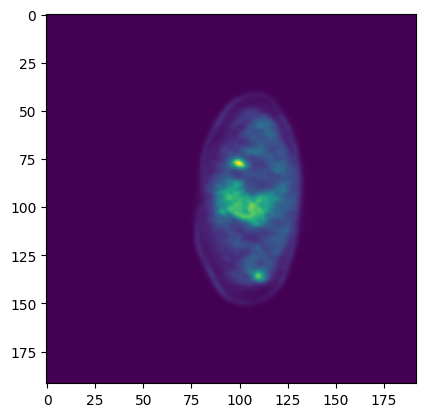

In [127]:
import matplotlib.pyplot as plt
mm=np.max(xd[0][:,:,192])
plt.imshow(xd[0][:,:,193])#+xd[1][:,:,192]*mm)

In [59]:
import pandas as pd
second_modality ='ct'
dataframe2=pd.read_csv("../../../../shared_data/NSCLC_Radiogenomics/info_dataset.csv")
dataframe2=dataframe2[dataframe2["egfr_exist"]==1]
dataframe2=dataframe2[dataframe2["pet_segmentation"]==True]
if second_modality == 'ct':
    dataframe2 = dataframe2[dataframe2["ct_segmentation"]==True]
    
dataframe2['label'] = (dataframe2['egfr'] == 'Mutant').astype(int)
dataframe2.reset_index(inplace=True, drop=True)


np.unique(dataframe2["label"])

array([0, 1])

In [62]:
ids=list(dataframe2["patient_id"])
ids

['R01-069',
 'R01-012',
 'R01-117',
 'R01-161',
 'R01-118',
 'AMC-027',
 'AMC-035',
 'AMC-016',
 'R01-078',
 'R01-036',
 'R01-110',
 'R01-152',
 'R01-137',
 'R01-087',
 'R01-115',
 'AMC-017',
 'R01-145',
 'R01-079',
 'R01-003',
 'R01-044',
 'AMC-036',
 'R01-140',
 'AMC-049',
 'R01-063',
 'R01-028',
 'R01-054',
 'R01-023',
 'R01-047',
 'R01-151',
 'AMC-040',
 'R01-072',
 'R01-066',
 'R01-053',
 'R01-005',
 'R01-030',
 'R01-058',
 'AMC-023',
 'R01-144',
 'AMC-045',
 'R01-091',
 'R01-035',
 'AMC-022',
 'R01-062',
 'R01-038',
 'R01-089',
 'R01-085',
 'R01-064',
 'R01-112',
 'AMC-026',
 'R01-148',
 'R01-098',
 'R01-025',
 'R01-009',
 'R01-132',
 'R01-090',
 'R01-103',
 'AMC-037',
 'R01-057',
 'R01-075',
 'AMC-006',
 'R01-032',
 'R01-088',
 'R01-162',
 'R01-096',
 'R01-043',
 'AMC-021',
 'AMC-024',
 'R01-004',
 'AMC-046',
 'R01-046',
 'R01-135',
 'R01-050',
 'R01-097',
 'R01-149',
 'R01-029',
 'AMC-011',
 'R01-105',
 'R01-127',
 'R01-084',
 'R01-067',
 'R01-076',
 'R01-059',
 'R01-018',
 'R0

In [63]:
def nrrd2voxels(data_info, dataset_path, modality):
    """ Get and stack patient slices into volumetrics arrays

    Args:
        data_info (pd.DataFrame): Info of patient.
        dataset_path (str): path to images.
        pet (bool, optional): pet images are divided by the mean of the liver pet. Defaults to False.

    Returns:
        img (np.array): CT or PET 3D data with shape (H, W, slices).
        mask (np.array): 3D nodule mask with shape (H, W, slices).
        label (np.array): nodule EGFR class 0: wildtype, 1: mutant, 2: unknown 3: not collected.

    """
    patient_id=data_info["patient_id"].values[0]
    path_img = os.path.join(dataset_path,patient_id,modality,data_info[f"{modality}_img_name"].values[0])
    path_mask = os.path.join(dataset_path,patient_id,modality,data_info[f"{modality}_seg_name"].values[0])
    img, _ = nrrd.read(path_img)
    msk, _ = nrrd.read(path_mask)
    label = data_info["label"].values[0]
    pet_liver_mean = 1
   
    if modality=="pet":
        pet_liver_mean = data_info["pet_mean"].values[0] + 1e-10
        img = img / pet_liver_mean
    else:
        img = apply_window_ct(img, width=1800, level=40)
    
    return img, msk, label

In [70]:
dataset_path="../../../../shared_data/NSCLC_Radiogenomics/images"
labels=[]
for modality in ["pet","ct"]:
    for patient_id in tqdm(ids):
        data_info=dataframe2[dataframe2["patient_id"]==patient_id]
        img_raw, mask_raw, label = nrrd2voxels(data_info, dataset_path, modality) 
        print(label,modality)
        labels.append(label)

  1%|▉                                                                                                                                   | 1/140 [00:00<00:34,  4.00it/s]

0 pet


  1%|█▉                                                                                                                                  | 2/140 [00:00<00:32,  4.21it/s]

0 pet


  2%|██▊                                                                                                                                 | 3/140 [00:00<00:35,  3.87it/s]

0 pet


  3%|███▊                                                                                                                                | 4/140 [00:01<00:52,  2.58it/s]

0 pet


  4%|████▋                                                                                                                               | 5/140 [00:01<00:47,  2.83it/s]

0 pet


  4%|█████▋                                                                                                                              | 6/140 [00:02<00:56,  2.39it/s]

1 pet


  5%|██████▌                                                                                                                             | 7/140 [00:03<01:26,  1.53it/s]

0 pet


  6%|███████▌                                                                                                                            | 8/140 [00:03<01:27,  1.51it/s]

0 pet


  6%|████████▍                                                                                                                           | 9/140 [00:04<01:21,  1.60it/s]

0 pet


  7%|█████████▎                                                                                                                         | 10/140 [00:04<01:09,  1.87it/s]

0 pet


  8%|██████████▎                                                                                                                        | 11/140 [00:05<00:59,  2.18it/s]

0 pet


  9%|███████████▏                                                                                                                       | 12/140 [00:05<01:05,  1.95it/s]

0 pet


  9%|████████████▏                                                                                                                      | 13/140 [00:06<00:55,  2.31it/s]

0 pet


 10%|█████████████                                                                                                                      | 14/140 [00:06<00:48,  2.58it/s]

1 pet


 11%|██████████████                                                                                                                     | 15/140 [00:06<00:44,  2.80it/s]

0 pet


 11%|██████████████▉                                                                                                                    | 16/140 [00:06<00:41,  2.97it/s]

0 pet


 12%|███████████████▉                                                                                                                   | 17/140 [00:07<00:53,  2.30it/s]

0 pet


 13%|████████████████▊                                                                                                                  | 18/140 [00:07<00:47,  2.59it/s]

1 pet


 14%|█████████████████▊                                                                                                                 | 19/140 [00:08<00:42,  2.84it/s]

1 pet


 14%|██████████████████▋                                                                                                                | 20/140 [00:09<01:11,  1.69it/s]

0 pet


 15%|███████████████████▋                                                                                                               | 21/140 [00:09<01:10,  1.69it/s]

1 pet


 16%|████████████████████▌                                                                                                              | 22/140 [00:10<01:09,  1.69it/s]

0 pet


 16%|█████████████████████▌                                                                                                             | 23/140 [00:10<00:57,  2.03it/s]

0 pet


 17%|██████████████████████▍                                                                                                            | 24/140 [00:11<00:50,  2.31it/s]

0 pet


 18%|███████████████████████▍                                                                                                           | 25/140 [00:11<00:44,  2.59it/s]

0 pet


 19%|████████████████████████▎                                                                                                          | 26/140 [00:11<00:40,  2.84it/s]

0 pet


 19%|█████████████████████████▎                                                                                                         | 27/140 [00:11<00:37,  3.03it/s]

0 pet


 20%|██████████████████████████▏                                                                                                        | 28/140 [00:12<00:35,  3.16it/s]

1 pet


 21%|███████████████████████████▏                                                                                                       | 29/140 [00:12<00:44,  2.50it/s]

0 pet


 21%|████████████████████████████                                                                                                       | 30/140 [00:12<00:40,  2.75it/s]

0 pet


 22%|█████████████████████████████                                                                                                      | 31/140 [00:13<00:37,  2.93it/s]

0 pet


 23%|█████████████████████████████▉                                                                                                     | 32/140 [00:14<01:04,  1.68it/s]

0 pet


 24%|██████████████████████████████▉                                                                                                    | 33/140 [00:15<01:23,  1.29it/s]

0 pet


 24%|███████████████████████████████▊                                                                                                   | 34/140 [00:15<01:05,  1.62it/s]

0 pet


 25%|████████████████████████████████▊                                                                                                  | 35/140 [00:16<00:55,  1.91it/s]

0 pet


 26%|█████████████████████████████████▋                                                                                                 | 36/140 [00:17<01:14,  1.40it/s]

1 pet


 26%|██████████████████████████████████▌                                                                                                | 37/140 [00:17<01:09,  1.48it/s]

1 pet


 27%|███████████████████████████████████▌                                                                                               | 38/140 [00:18<01:06,  1.54it/s]

0 pet


 28%|████████████████████████████████████▍                                                                                              | 39/140 [00:19<01:04,  1.58it/s]

1 pet


 29%|█████████████████████████████████████▍                                                                                             | 40/140 [00:19<00:59,  1.68it/s]

0 pet


 29%|██████████████████████████████████████▎                                                                                            | 41/140 [00:19<00:50,  1.97it/s]

0 pet


 30%|███████████████████████████████████████▎                                                                                           | 42/140 [00:20<00:41,  2.34it/s]

1 pet


 31%|████████████████████████████████████████▏                                                                                          | 43/140 [00:20<00:38,  2.50it/s]

0 pet


 31%|█████████████████████████████████████████▏                                                                                         | 44/140 [00:21<01:00,  1.60it/s]

0 pet


 32%|██████████████████████████████████████████                                                                                         | 45/140 [00:21<00:48,  1.95it/s]

1 pet


 33%|███████████████████████████████████████████                                                                                        | 46/140 [00:23<01:04,  1.45it/s]

0 pet


 34%|███████████████████████████████████████████▉                                                                                       | 47/140 [00:23<00:52,  1.76it/s]

0 pet


 34%|████████████████████████████████████████████▉                                                                                      | 48/140 [00:23<00:45,  2.04it/s]

0 pet


 35%|█████████████████████████████████████████████▊                                                                                     | 49/140 [00:24<00:47,  1.92it/s]

0 pet


 36%|██████████████████████████████████████████████▊                                                                                    | 50/140 [00:24<00:48,  1.86it/s]

0 pet


 36%|███████████████████████████████████████████████▋                                                                                   | 51/140 [00:25<00:39,  2.27it/s]

1 pet


 37%|████████████████████████████████████████████████▋                                                                                  | 52/140 [00:25<00:34,  2.51it/s]

0 pet


 38%|█████████████████████████████████████████████████▌                                                                                 | 53/140 [00:25<00:31,  2.74it/s]

0 pet


 39%|██████████████████████████████████████████████████▌                                                                                | 54/140 [00:25<00:31,  2.76it/s]

1 pet


 39%|███████████████████████████████████████████████████▍                                                                               | 55/140 [00:26<00:36,  2.30it/s]

0 pet


 40%|████████████████████████████████████████████████████▍                                                                              | 56/140 [00:27<00:42,  1.99it/s]

0 pet


 41%|█████████████████████████████████████████████████████▎                                                                             | 57/140 [00:27<00:44,  1.87it/s]

0 pet


 41%|██████████████████████████████████████████████████████▎                                                                            | 58/140 [00:28<00:37,  2.17it/s]

0 pet


 42%|███████████████████████████████████████████████████████▏                                                                           | 59/140 [00:28<00:40,  2.00it/s]

1 pet


 43%|████████████████████████████████████████████████████████▏                                                                          | 60/140 [00:28<00:33,  2.36it/s]

0 pet


 44%|█████████████████████████████████████████████████████████                                                                          | 61/140 [00:29<00:30,  2.58it/s]

0 pet


 44%|██████████████████████████████████████████████████████████                                                                         | 62/140 [00:29<00:28,  2.78it/s]

1 pet


 45%|██████████████████████████████████████████████████████████▉                                                                        | 63/140 [00:30<00:33,  2.32it/s]

1 pet


 46%|███████████████████████████████████████████████████████████▉                                                                       | 64/140 [00:30<00:30,  2.53it/s]

0 pet


 46%|████████████████████████████████████████████████████████████▊                                                                      | 65/140 [00:31<00:45,  1.66it/s]

0 pet


 47%|█████████████████████████████████████████████████████████████▊                                                                     | 66/140 [00:32<00:44,  1.67it/s]

0 pet


 48%|██████████████████████████████████████████████████████████████▋                                                                    | 67/140 [00:32<00:43,  1.68it/s]

0 pet


 49%|███████████████████████████████████████████████████████████████▋                                                                   | 68/140 [00:33<00:36,  1.99it/s]

0 pet


 49%|████████████████████████████████████████████████████████████████▌                                                                  | 69/140 [00:33<00:38,  1.83it/s]

0 pet


 50%|█████████████████████████████████████████████████████████████████▌                                                                 | 70/140 [00:34<00:33,  2.07it/s]

0 pet


 51%|██████████████████████████████████████████████████████████████████▍                                                                | 71/140 [00:34<00:35,  1.96it/s]

0 pet


 51%|███████████████████████████████████████████████████████████████████▎                                                               | 72/140 [00:35<00:36,  1.88it/s]

0 pet


 52%|████████████████████████████████████████████████████████████████████▎                                                              | 73/140 [00:35<00:31,  2.16it/s]

0 pet


 53%|█████████████████████████████████████████████████████████████████████▏                                                             | 74/140 [00:36<00:34,  1.92it/s]

0 pet


 54%|██████████████████████████████████████████████████████████████████████▏                                                            | 75/140 [00:36<00:36,  1.77it/s]

0 pet


 54%|███████████████████████████████████████████████████████████████████████                                                            | 76/140 [00:37<00:37,  1.73it/s]

0 pet


 55%|████████████████████████████████████████████████████████████████████████                                                           | 77/140 [00:37<00:30,  2.09it/s]

0 pet


 56%|████████████████████████████████████████████████████████████████████████▉                                                          | 78/140 [00:38<00:31,  1.95it/s]

1 pet


 56%|█████████████████████████████████████████████████████████████████████████▉                                                         | 79/140 [00:38<00:27,  2.25it/s]

0 pet


 57%|██████████████████████████████████████████████████████████████████████████▊                                                        | 80/140 [00:38<00:23,  2.53it/s]

0 pet


 58%|███████████████████████████████████████████████████████████████████████████▊                                                       | 81/140 [00:39<00:27,  2.13it/s]

1 pet


 59%|████████████████████████████████████████████████████████████████████████████▋                                                      | 82/140 [00:39<00:24,  2.38it/s]

0 pet


 59%|█████████████████████████████████████████████████████████████████████████████▋                                                     | 83/140 [00:40<00:21,  2.62it/s]

0 pet


 60%|██████████████████████████████████████████████████████████████████████████████▌                                                    | 84/140 [00:40<00:24,  2.25it/s]

1 pet


 61%|███████████████████████████████████████████████████████████████████████████████▌                                                   | 85/140 [00:40<00:21,  2.60it/s]

0 pet


 61%|████████████████████████████████████████████████████████████████████████████████▍                                                  | 86/140 [00:41<00:18,  2.85it/s]

0 pet


 62%|█████████████████████████████████████████████████████████████████████████████████▍                                                 | 87/140 [00:41<00:18,  2.91it/s]

0 pet


 63%|██████████████████████████████████████████████████████████████████████████████████▎                                                | 88/140 [00:41<00:16,  3.09it/s]

0 pet


 64%|███████████████████████████████████████████████████████████████████████████████████▎                                               | 89/140 [00:42<00:16,  3.03it/s]

0 pet


 64%|████████████████████████████████████████████████████████████████████████████████████▏                                              | 90/140 [00:42<00:20,  2.42it/s]

1 pet


 65%|█████████████████████████████████████████████████████████████████████████████████████▏                                             | 91/140 [00:43<00:22,  2.17it/s]

0 pet


 66%|██████████████████████████████████████████████████████████████████████████████████████                                             | 92/140 [00:43<00:22,  2.10it/s]

1 pet


 66%|███████████████████████████████████████████████████████████████████████████████████████                                            | 93/140 [00:44<00:19,  2.35it/s]

0 pet


 67%|███████████████████████████████████████████████████████████████████████████████████████▉                                           | 94/140 [00:44<00:22,  2.07it/s]

0 pet


 68%|████████████████████████████████████████████████████████████████████████████████████████▉                                          | 95/140 [00:45<00:22,  1.97it/s]

1 pet


 69%|█████████████████████████████████████████████████████████████████████████████████████████▊                                         | 96/140 [00:45<00:23,  1.88it/s]

1 pet


 69%|██████████████████████████████████████████████████████████████████████████████████████████▊                                        | 97/140 [00:46<00:19,  2.17it/s]

0 pet


 70%|███████████████████████████████████████████████████████████████████████████████████████████▋                                       | 98/140 [00:47<00:28,  1.49it/s]

0 pet


 71%|████████████████████████████████████████████████████████████████████████████████████████████▋                                      | 99/140 [00:47<00:23,  1.77it/s]

0 pet


 71%|████████████████████████████████████████████████████████████████████████████████████████████▊                                     | 100/140 [00:47<00:18,  2.13it/s]

1 pet


 72%|█████████████████████████████████████████████████████████████████████████████████████████████▊                                    | 101/140 [00:48<00:16,  2.33it/s]

0 pet


 73%|██████████████████████████████████████████████████████████████████████████████████████████████▋                                   | 102/140 [00:48<00:14,  2.65it/s]

0 pet


 74%|███████████████████████████████████████████████████████████████████████████████████████████████▋                                  | 103/140 [00:48<00:13,  2.84it/s]

1 pet


 74%|████████████████████████████████████████████████████████████████████████████████████████████████▌                                 | 104/140 [00:49<00:11,  3.06it/s]

0 pet


 75%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                                | 105/140 [00:49<00:13,  2.57it/s]

1 pet


 76%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                               | 106/140 [00:50<00:17,  1.90it/s]

0 pet


 76%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                              | 107/140 [00:51<00:18,  1.83it/s]

0 pet


 77%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                             | 108/140 [00:51<00:14,  2.22it/s]

1 pet


 78%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 109/140 [00:51<00:12,  2.41it/s]

0 pet


 79%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏                           | 110/140 [00:51<00:11,  2.67it/s]

0 pet


 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████                           | 111/140 [00:52<00:14,  1.95it/s]

1 pet


 80%|████████████████████████████████████████████████████████████████████████████████████████████████████████                          | 112/140 [00:52<00:12,  2.26it/s]

0 pet


 81%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉                         | 113/140 [00:53<00:10,  2.54it/s]

0 pet


 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊                        | 114/140 [00:53<00:09,  2.62it/s]

0 pet


 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊                       | 115/140 [00:54<00:11,  2.22it/s]

1 pet


 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋                      | 116/140 [00:54<00:12,  1.92it/s]

0 pet


 84%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 117/140 [00:55<00:10,  2.30it/s]

0 pet


 84%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 118/140 [00:55<00:10,  2.04it/s]

0 pet


 85%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 119/140 [00:55<00:08,  2.40it/s]

0 pet


 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 120/140 [00:56<00:07,  2.66it/s]

0 pet


 86%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 121/140 [00:56<00:06,  2.91it/s]

0 pet


 87%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 122/140 [00:57<00:07,  2.38it/s]

0 pet


 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 123/140 [00:57<00:07,  2.18it/s]

1 pet


 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 124/140 [00:58<00:06,  2.40it/s]

0 pet


 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 125/140 [00:58<00:05,  2.64it/s]

0 pet


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████             | 126/140 [00:58<00:04,  2.86it/s]

0 pet


 91%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 127/140 [00:58<00:04,  3.00it/s]

0 pet


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 128/140 [00:59<00:03,  3.29it/s]

0 pet


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 129/140 [00:59<00:03,  3.33it/s]

0 pet


 93%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 130/140 [00:59<00:02,  3.44it/s]

0 pet


 94%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 131/140 [01:00<00:03,  2.63it/s]

0 pet


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 132/140 [01:00<00:02,  2.98it/s]

0 pet


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 133/140 [01:01<00:02,  2.56it/s]

1 pet


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 134/140 [01:01<00:02,  2.83it/s]

0 pet


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 135/140 [01:01<00:01,  2.54it/s]

1 pet


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 136/140 [01:02<00:01,  2.77it/s]

0 pet


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 137/140 [01:02<00:01,  2.87it/s]

0 pet


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 138/140 [01:02<00:00,  2.52it/s]

0 pet


 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 139/140 [01:03<00:00,  2.78it/s]

1 pet


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 140/140 [01:03<00:00,  2.20it/s]


0 pet


  0%|                                                                                                                                            | 0/140 [00:02<?, ?it/s]


NameError: name 'apply_window_ct' is not defined

In [16]:
dataframe2[dataframe2["patient_id"]=="R01-118"]["patient_id"].values[0]

'R01-118'

In [91]:
dataframe2.iloc[9]

patient_id                                          AMC-027
ct_segmentation                                        True
ct_seg_name                    AMC-027_ct_segmentation.nrrd
ct_image                                               True
ct_img_name                           AMC-027_ct_image.nrrd
chest_ct_segmentation                                  True
chest_ct_seg_name        AMC-027_chest_ct_segmentation.nrrd
chest_ct_image                                         True
chest_ct_img_name               AMC-027_chest_ct_image.nrrd
pet_segmentation                                       True
pet_seg_name                  AMC-027_pet_segmentation.nrrd
pet_image                                              True
pet_img_name                         AMC-027_pet_image.nrrd
pet_mean                                       10542.702937
egfr                                                 Mutant
egfr_exist                                                1
Name: 9, dtype: object

In [131]:
def flip_image(image, mask, flip_type):
    """ Flip a 3D image and mask horizontal or vertically

    Args:
        image (np.array): CT or PET 3D data with shape (H, W, slices, Ch).
        mask (np.array): 3D nodule boolean mask with shape (H, W, slices).
        flip_type (str): None, 'horizontal' or 'vertical'.

    Returns:
        image_flip (np.array): flipped 3D image.
        mask_flip (np.array): flipped 3D mask.

    """
    image_flip = image.copy()
    mask_flip = mask.copy()
    if flip_type == 'horizontal':
        return image_flip[:, ::-1, ...], mask_flip[:, ::-1, ...]
    elif flip_type == 'vertical':
        return image_flip[::-1, ...], mask_flip[::-1, ...]
    return image_flip, mask_flip

In [150]:
from scipy.ndimage import rotate
def rotate_image(image, mask, angle, axes=(0, 1)):
    """ Rotates a 3D image and mask in the plane XY

    Args:
        image (np.array): CT or PET 3D data with shape (H, W, slices, Ch).
        mask (np.array): 3D nodule boolean mask with shape (H, W, slices).
        angle (int): rotation angle in degrees.
        axes (tuple, optional): rotation axis. Defaults to (0, 1).

    Returns:
        image_rot (TYPE): rotated 3D image.
        mask_rot (TYPE): rotated 3D mask.

    """
    image_rot = image.copy()
    mask_rot = mask.copy()
    if angle == 0:
        return image_rot, mask_rot
    image_rot = rotate(image_rot, angle, axes=axes, reshape=False, mode='nearest')
    #image_rot = np.clip(image_rot, 0, 1)
    mask_rot = rotate(mask_rot, angle, axes=axes, reshape=False, mode='nearest')
    mask_rot = mask_rot > 0
    return image_rot, mask_rot

In [134]:
xd=nrrd2voxels(dataframe2.iloc[9], "../../../../shared_data/NSCLC_Radiogenomics/images", "ct")

In [130]:
np.shape(xd[0])

(192, 192, 263)

In [140]:
image_flip, mask_flip=flip_image(xd[0], xd[1], "vertical")

In [ ]:
image_flip

-1179.2097438913788 1045.0655447469217 -3023.0 3071.0


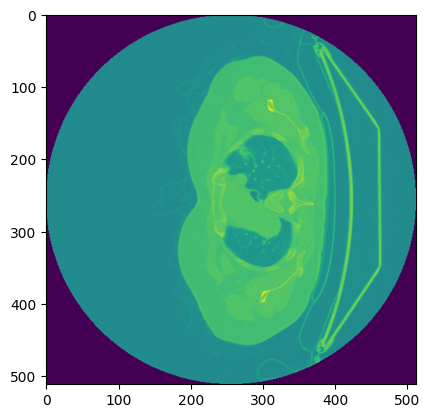

In [155]:
import matplotlib.pyplot as plt
plt.imshow(xd[0][:,:,193])#+xd[1][:,:,192]*mm)
print(np.mean(xd[0]),np.std(xd[0]),np.min(xd[0]),np.max(xd[0]))

-1179.2097438913788 1045.0655447469296 -3023.0000000000027 3071.000000000002


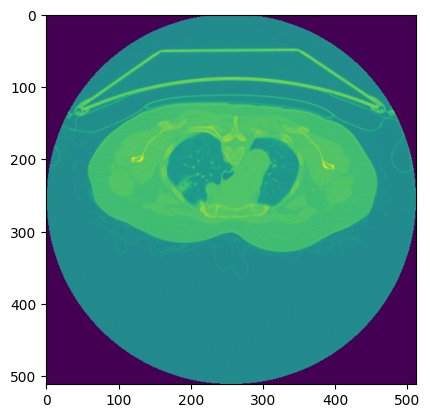

In [158]:
import matplotlib.pyplot as plt
plt.imshow(image_rot[:,:,193])#+xd[1][:,:,192]*mm)
print(np.mean(image_rot),np.std(image_rot),np.min(image_rot),np.max(image_rot))

In [151]:
image_rot, mask_rot=rotate_image(xd[0], xd[1], 90)

In [159]:
indices = np.array(np.where(mask_rot))

In [189]:
np.sqrt(21*18)

19.44222209522358

In [202]:
def extract_coords(mask):
    indices = np.array(np.where(mask))
    ymin = np.min(indices[0, :])
    xmin = np.min(indices[1, :])
    zmin = np.min(indices[2, :])
    ymax = np.max(indices[0, :])
    xmax = np.max(indices[1, :])
    zmax = np.max(indices[2, :])
    
    h = ymax - ymin
    w = xmax - xmin
    d = zmax - zmin
    
    sizemax=np.max((h,w))
    hwsize=(sizemax//32+1)*32
    dsize=(d//32+1)*32
    
    hwdiff=(hwsize-sizemax)//2
    ddiff=(dsize-d)//2
    
    ymin=max(ymin-hwdiff,0)
    xmin=max(xmin-hwdiff,0)
    zmin=max(zmin-ddiff,0)
    ymax = ymin+hwsize
    xmax = xmin+hwsize
    zmax = zmin+dsize
    return xmin, ymin, zmin, xmax, ymax, zmax


In [203]:
xmin, ymin, zmin, xmax, ymax, zmax = extract_coords(mask_rot)

In [231]:
xdd=mask_rot[ymin:ymax,xmin:xmax,zmin:zmax]
np.shape(xdd)

(32, 32, 32)

In [243]:
xas=[]
for i in range(5):
    xas+=[xdd]

In [244]:
np.shape(xas)

(5, 32, 32, 32)

In [235]:
np.expand_dims(np.expand_dims(xdd, axis=0),axis=0).shape

(1, 1, 32, 32, 32)

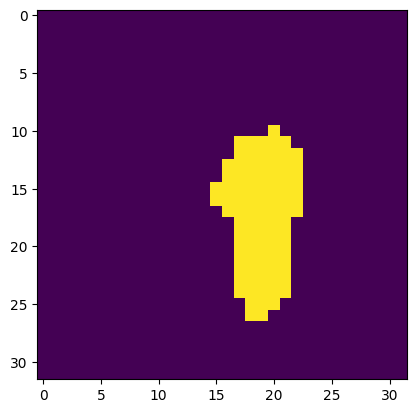

In [208]:
plt.imshow(xdd[:,:,14])

In [201]:

ymin = np.min(indices[0, :])
xmin = np.min(indices[1, :])
zmin = np.min(indices[2, :])
ymax = np.max(indices[0, :])
xmax = np.max(indices[1, :])
zmax = np.max(indices[2, :])

h = max((ymax - ymin), margin)
w = max((xmax - xmin), margin)
d = max((zmax - zmin), margin)
sizemax=np.max((h,w))
hwsize=(sizemax//32+1)*32
dsize=(d//32+1)*32

hwdiff=(hwsize-sizemax)//2
ddiff=(dsize-d)//2

ymin=ymin-hwdiff
xmin=xmin-hwdiff
zmin=zmin-ddiff
ymax = ymin+hwsize
xmax = xmin+hwsize
zmax = zmin+dsize
#return xmin, ymin, xmax, ymax, zmin, zmax
sizemax
print("min :",ymin,xmin,zmin,"max:",ymax,xmax,zmax,"size :", ymax-ymin,xmax-xmin,zmax-zmin)

min : 226 179 176 max: 258 211 208 size : 32 32 32


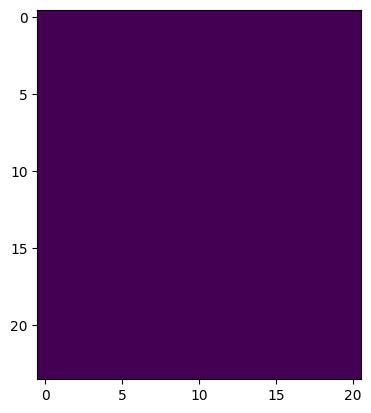

In [187]:
plt.imshow(mask_rot[ymin-1:ymax+2,xmin-1:xmax+2,zmin+5])

In [8]:
ls ../../../../shared_data/PET-CT/data/feature_swin3d/stanford_dataset

AMC-006_ct.parquet*   R01-036_pet.parquet*  R01-095_pet.parquet*
AMC-006_pet.parquet*  R01-037_ct.parquet*   R01-096_ct.parquet*
AMC-011_ct.parquet*   R01-037_pet.parquet*  R01-096_pet.parquet*
AMC-011_pet.parquet*  R01-038_ct.parquet*   R01-097_ct.parquet*
AMC-012_ct.parquet*   R01-038_pet.parquet*  R01-097_pet.parquet*
AMC-012_pet.parquet*  R01-041_ct.parquet*   R01-098_ct.parquet*
AMC-013_ct.parquet*   R01-041_pet.parquet*  R01-098_pet.parquet*
AMC-013_pet.parquet*  R01-043_ct.parquet*   R01-099_ct.parquet*
AMC-016_ct.parquet*   R01-043_pet.parquet*  R01-099_pet.parquet*
AMC-016_pet.parquet*  R01-044_ct.parquet*   R01-100_ct.parquet*
AMC-017_ct.parquet*   R01-044_pet.parquet*  R01-100_pet.parquet*
AMC-017_pet.parquet*  R01-045_ct.parquet*   R01-103_ct.parquet*
AMC-020_ct.parquet*   R01-045_pet.parquet*  R01-103_pet.parquet*
AMC-020_pet.parquet*  R01-046_ct.parquet*   R01-104_ct.parquet*
AMC-021_ct.parquet*   R01-046_pet.parquet*  R01-104_pet.parquet*
AMC-021_pet.parquet*  R01-047_ct

In [77]:
datasets = ['stanford_dataset']#'santa_maria_dataset', 
feature_dir = os.path.join('../../../../shared_data/PET-CT', 'data', 'feature_swin3d_2')
df = []
for dataset in datasets:
    dataset_features_dir = os.path.join(feature_dir, dataset)
    df_fns = os.listdir(dataset_features_dir)
    for df_fn in df_fns:
        df_path = os.path.join(dataset_features_dir, df_fn)
        df_aux = pd.read_parquet(df_path)
        df.append(df_aux)

In [87]:
df_aux["flip"] = df_aux['flip'].astype(str)
df_aux["angle"] = df_aux['angle'].astype(int)
aumentation = np.logical_not(np.logical_and(df_aux["flip"] == 'None', df_aux['angle'] == 0))
df_aux["aumentation"]=aumentation
print(aumentation)

0    False
1     True
2     True
3     True
4     True
5     True
dtype: bool


In [88]:
df_aux

,feature_id,angle,flip,patient_id,label,dataset,modality,augmentation,aumentation
0,0,0,None,R01-032,0,stanford,ct,True,False
1,1,90,None,R01-032,0,stanford,ct,True,True
2,2,0,horizontal,R01-032,0,stanford,ct,True,True
3,3,90,horizontal,R01-032,0,stanford,ct,True,True
4,4,0,vertical,R01-032,0,stanford,ct,True,True
5,5,90,vertical,R01-032,0,stanford,ct,True,True


In [157]:
datasets = ['stanford_dataset']#'santa_maria_dataset', 
    #feature_dir = os.path.join('../../../Data/PET-CT', 'data', 'features_norm_pet_correct')
feature_dir = os.path.join('../../../../shared_data/PET-CT', 'data', 'feature_swin3d_firstv')
output_path = os.path.join(feature_dir, 'petct.parquet')

df = []
for dataset in datasets:
    dataset_features_dir = os.path.join(feature_dir, dataset)
    if os.path.exists(dataset_features_dir):
        df_fns = os.listdir(dataset_features_dir)
        for df_fn in df_fns:
            df_path = os.path.join(dataset_features_dir, df_fn)
            df_aux = pd.read_parquet(df_path)
            df.append(df_aux)
df = pd.concat(df)
print(df)
df['feature_id'] = df['feature_id'].astype(int)
df['angle'] = df['angle'].astype(int)
df['label'] = df['label'].astype(int)
df['flip'] = df['flip'].astype(str)
augmentation=np.logical_not(np.logical_and(df['flip'] == 'None', df['angle'] == 0))
df['augmentation'] = augmentation
df.reset_index(drop=True, inplace=True)
#df.to_parquet(output_path)

    feature_id  angle        flip patient_id  label   dataset modality  \
0            0      0        None    R01-126      0  stanford      pet   
1            1     90        None    R01-126      0  stanford      pet   
2            2      0  horizontal    R01-126      0  stanford      pet   
3            3     90  horizontal    R01-126      0  stanford      pet   
4            4      0    vertical    R01-126      0  stanford      pet   
..         ...    ...         ...        ...    ...       ...      ...   
1            1     90        None    R01-032      0  stanford       ct   
2            2      0  horizontal    R01-032      0  stanford       ct   
3            3     90  horizontal    R01-032      0  stanford       ct   
4            4      0    vertical    R01-032      0  stanford       ct   
5            5     90    vertical    R01-032      0  stanford       ct   

    augmentation  
0           True  
1           True  
2           True  
3           True  
4           True

In [135]:
len(np.unique(df[df["modality"]=="ct"]["patient_id"]))

140

In [4]:
import numpy as np

In [83]:
df=pd.read_parquet("../../../../shared_data/PET-CT/data/feature_swin3d_firstv/petct.parquet")
modality_a="pet"
modality_b="ct"
df_ct = df[df['modality'] == modality_b].reset_index(drop=True)
df_pet = df[df['modality'] == modality_a].reset_index(drop=True)
n_samples = len(df_ct['patient_id'].unique())
dataframe = df_ct.copy()
dataframe = dataframe.groupby(['patient_id'])[['modality', 'dataset', 'label']].first()
dataframe.reset_index(inplace=True, drop=False)
repeat_times = np.clip(np.ceil(n_samples / df.shape[0]), 2, 8)
dataframe = pd.DataFrame(np.repeat(dataframe.values, repeat_times, axis=0), columns=dataframe.columns)

In [84]:
dataframe

,patient_id,modality,dataset,label
0,AMC-006,ct,stanford,0
1,AMC-006,ct,stanford,0
2,AMC-011,ct,stanford,0
3,AMC-011,ct,stanford,0
4,AMC-012,ct,stanford,1
...,...,...,...,...
275,R01-153,ct,stanford,0
276,R01-161,ct,stanford,0
277,R01-161,ct,stanford,0
278,R01-162,ct,stanford,1


In [44]:
flip_angles = df.groupby(['flip', 'angle'], as_index=False).size()[['flip', 'angle']]
flip_angles

,flip,angle
0,None,0
1,None,90
2,horizontal,0
3,horizontal,90
4,vertical,0
5,vertical,90


In [45]:
df_ct = df_ct.set_index(['patient_id', 'angle', 'flip'])
df_pet = df_pet.set_index(['patient_id', 'angle', 'flip'])

In [82]:
np.unique(dataframe["modality"])

array(['ct'], dtype=object)

In [47]:
df

,feature_id,angle,flip,patient_id,label,dataset,modality,augmentation,spatial_res
12,0,0,None,R01-144,0,stanford,ct,False,"[0.9765620231628418, 0.9765620231628418, 3.269..."
13,1,90,None,R01-144,0,stanford,ct,True,"[0.9765620231628418, 0.9765620231628418, 3.269..."
14,2,0,horizontal,R01-144,0,stanford,ct,True,"[0.9765620231628418, 0.9765620231628418, 3.269..."
15,3,90,horizontal,R01-144,0,stanford,ct,True,"[0.9765620231628418, 0.9765620231628418, 3.269..."
16,4,0,vertical,R01-144,0,stanford,ct,True,"[0.9765620231628418, 0.9765620231628418, 3.269..."
...,...,...,...,...,...,...,...,...,...
1657,1,90,None,R01-162,1,stanford,pet,True,"[3.6458332538604736, 3.6458332538604736, 3.269..."
1658,2,0,horizontal,R01-162,1,stanford,pet,True,"[3.6458332538604736, 3.6458332538604736, 3.269..."
1659,3,90,horizontal,R01-162,1,stanford,pet,True,"[3.6458332538604736, 3.6458332538604736, 3.269..."
1660,4,0,vertical,R01-162,1,stanford,pet,True,"[3.6458332538604736, 3.6458332538604736, 3.269..."


In [78]:
idx=39
enable_random_crop = True
noise_val = 10
sample = dataframe.iloc[idx]
print(sample)
patient_id = sample.patient_id
label = sample.label
noise = np.random.random(3) * noise_val - noise_val/2
scale_noise = np.random.uniform(0.85, 1.15)
if True:
    [[flip, angle]] = flip_angles.sample(n=1).values
    print(flip, angle)
else:
    flip = 'None'
    angle = 0
    noise = noise * 0
    scale_noise = 1.0


patient_id     AMC-045
modality            ct
dataset       stanford
label                1
Name: 39, dtype: object
horizontal 90


In [286]:
ls ../../../../shared_data/PET-CT/data/feature_swin3d_firstv

features_masks_ct.hdf5*   petct.parquet*
features_masks_pet.hdf5*  stanford_dataset/


In [11]:
folder_path="../../../../shared_data/PET-CT/data/feature_swin3d_firstv/"

In [13]:
import h5py
import os
hdf5_pet_path = os.path.join(folder_path, f'features_masks_{modality_a}.hdf5')
hdf5_ct_path = os.path.join(folder_path, f'features_masks_{modality_b}.hdf5')

with h5py.File(hdf5_pet_path, 'r') as h5f:
    for kk in h5f.keys():
        #print(h5f.keys())
        slice_features = h5f[f'{kk}/features/{0}'][()]
        slice_masks = h5f[f'{kk}/masks/{0}'][()]
        print(np.shape(slice_features),np.shape(slice_masks))

(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(48, 8, 8, 8) (32, 32, 32)
(

In [19]:
np.transpose(np.ones((48,16,8,8)), axes=(2, 3, 1, 0)).shape

(8, 8, 16, 48)

In [17]:
np.shape(slice_masks)
h_orig, w_orig = np.array((64,32,32))[1:] #C, D, H, W
print(h_orig, w_orig)

32 32


In [283]:
hdf5_path

'../../../Data/PET-CT/lung_radiomics/lung_radiomics_datasets.hdf5'

In [35]:

def positional_encoding_3d(x, y, z, D, scale=10000):
    x, y, z = np.asarray(x), np.asarray(y), np.asarray(z)
    n_points = x.shape[0]
    encoding = np.zeros((n_points, D))

    for i in range(D // 6):
        exponent = scale ** (6 * i / D)
        encoding[:, 2*i] = np.sin(x / exponent)
        encoding[:, 2*i + 1] = np.cos(x / exponent)
        encoding[:, 2*i + D // 3] = np.sin(y / exponent)
        encoding[:, 2*i + 1 + D // 3] = np.cos(y / exponent)
        encoding[:, 2*i + 2 * D // 3] = np.sin(z / exponent)
        encoding[:, 2*i + 1 + 2 * D // 3] = np.cos(z / exponent)

    return encoding


In [32]:
feature_dim=48
def get_features( hdf5_path, patient_id, feature_id,angle, flip, noise, spatial_res):

        with h5py.File(hdf5_path, 'r') as h5f:
            features = h5f[f'{patient_id}/features/{feature_id}'][()]
            mask_orig = h5f[f'{patient_id}/masks/{feature_id}'][()]
            
        h_orig, w_orig = mask_orig.shape[1:]
        features = np.transpose(features, axes=(2, 3, 1, 0))  # (h, w, slice, feat_dim)
        h_new, w_new = features.shape[0], features.shape[1]

        x, y, z = np.meshgrid(np.arange(0, features.shape[0]),
                              np.arange(0, features.shape[1]),
                              np.arange(0, features.shape[2]))
        x = (x.flatten() / w_new).flatten() * w_orig * spatial_res[0]
        y = (y.flatten() / h_new).flatten() * h_orig * spatial_res[1]
        z = (z.flatten()).flatten() * spatial_res[2]

        x = (x - x.mean() + noise[0])
        y = (y - y.mean() + noise[1])
        z = (z - z.mean() + noise[2])


        pe = positional_encoding_3d(x, y, z, D=feature_dim, scale=10000)
        print(np.shape(pe))
        features = features.reshape(-1, feature_dim) + pe / 4 
    
        return features

In [49]:
df_ct

feature_id  label   dataset modality  \
patient_id angle flip                                               
R01-144    0     None                 0      0  stanford       ct   
           90    None                 1      0  stanford       ct   
           0     horizontal           2      0  stanford       ct   
           90    horizontal           3      0  stanford       ct   
           0     vertical             4      0  stanford       ct   
...                                 ...    ...       ...      ...   
R01-032    90    None                 1      0  stanford       ct   
           0     horizontal           2      0  stanford       ct   
           90    horizontal           3      0  stanford       ct   
           0     vertical             4      0  stanford       ct   
           90    vertical             5      0  stanford       ct   

                             augmentation  \
patient_id angle flip                       
R01-144    0     None               False   
           90    None                True   
           0     horizontal          True   
           90    horizontal          True   
           0     vertical            True   
...                                   ...   
R01-032    90    None                True   
           0     horizontal          True   
           90    horizontal          True   
           0     vertical            True   
           90    vertical            True   

                                                                   spatial_res  
patient_id angle flip                                                           
R01-144    0     None        [0.9765620231628418, 0.9765620231628418, 3.269...  
           90    None        [0.9765620231628418, 0.9765620231628418, 3.269...  
           0     horizontal  [0.9765620231628418, 0.9765620231628418, 3.269...  
           90    horizontal  [0.9765620231628418, 0.9765620231628418, 3.269...  
           0     vertical    [0.9765620231628418, 0.9765620231628418, 3.269...  
...                                                                        ...  
R01-032    90    None        [0.9765620231628418, 0.9765620231628418, 3.269...  
           0     horizontal  [0.9765620231628418, 0.9765620231628418, 3.269...  
           90    horizontal  [0.9765620231628418, 0.9765620231628418, 3.269...  
           0     vertical    [0.9765620231628418, 0.9765620231628418, 3.269...  
           90    vertical    [0.9765620231628418, 0.9765620231628418, 3.269...  

[840 rows x 6 columns]

In [53]:
df_pet.loc[(patient_id, angle, flip)]['spatial_res']

AttributeError: 'numpy.ndarray' object has no attribute 'values'

In [56]:
pip install scikit-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.9/12.9 MB 27.6 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3/3 [scikit-learn] [scikit-learn]
Note: you may need to restart the kernel to use updated packages.


In [61]:
from sklearn.preprocessing import OneHotEncoder
def create_labelmap(label_names):
    """ Create a labelmap from a list labels

    Args:
        label_names (list): list of labels.

    Returns:
        labelmap (dict): to convert label_id to label_name.
        labelmap_inv (dict): to convert label_name to label_id.

    """
    labelmap = dict(zip(np.arange(0, len(label_names)), label_names))
    labelmap_inv = dict(zip(label_names, np.arange(0, len(label_names))))
    return labelmap, labelmap_inv
    
def get_label_encoder(df):
    EGFR_names = list(df['label'].unique())
    EGFR_names.sort()
    EGFR_lm, EGFR_lm_inv = create_labelmap(EGFR_names)
    
    EGFR_encoder = OneHotEncoder(handle_unknown='ignore')
    EGFR_encoder.fit(np.array(list(EGFR_lm.keys())).reshape(-1, 1))
    return EGFR_encoder

In [62]:
EGFR_encoder=get_label_encoder(df)

In [66]:
label_encoder=EGFR_encoder

In [67]:
labels

array([0])

In [79]:
data_ct=df_ct.loc[(patient_id, angle, flip)]
feature_id_ct = data_ct['feature_id']#.values
spatial_res = data_ct['spatial_res']
spatial_res = np.abs(spatial_res) * scale_noise
features_ct = get_features(hdf5_ct_path, patient_id,feature_id_ct, angle, flip, noise, spatial_res)
features_ct = torch.as_tensor(features_ct, dtype=torch.float32)

data_pet=df_pet.loc[(patient_id, angle, flip)]
feature_id_pet = data_pet['feature_id']
spatial_res = data_pet['spatial_res']
spatial_res = np.abs(spatial_res) * scale_noise
features_pet = get_features(hdf5_pet_path, patient_id, feature_id_pet,angle, flip, noise, spatial_res)
features_pet = torch.as_tensor(features_pet, dtype=torch.float32)

labels = np.array(label)
labels = np.expand_dims(labels, axis=-1)
labels = label_encoder.transform(labels.reshape(-1, 1)).toarray()
print(labels)
labels = torch.as_tensor(labels, dtype=torch.float32)
    
print(np.shape(features_ct), np.shape(features_pet), labels, patient_id)

(512, 48)
(512, 48)
[[0. 1.]]
torch.Size([512, 48]) torch.Size([512, 48]) tensor([[0., 1.]]) AMC-045


In [246]:
df = pd.read_parquet("../../../../shared_data/PET-CT/data/feature_swin3d_firstv/petct.parquet")
df_pet=df[df["modality"]=="pet"]
df_ct=df[df["modality"]=="xt"]

In [240]:
df_old = pd.read_parquet("../../../../shared_data/PET-CT/data/features_norm_pet_full/petct.parquet")
df_old

,feature_id,slice,angle,flip,patient_id,label,dataset,modality,augmentation,spatial_res
0,0,0,0,None,sm_034,0,santa_maria,pet,False,"[4.0, 4.0, 4.0]"
1,1,1,0,None,sm_034,0,santa_maria,pet,False,"[4.0, 4.0, 4.0]"
2,2,2,0,None,sm_034,0,santa_maria,pet,False,"[4.0, 4.0, 4.0]"
3,3,3,0,None,sm_034,0,santa_maria,pet,False,"[4.0, 4.0, 4.0]"
4,4,4,0,None,sm_034,0,santa_maria,pet,False,"[4.0, 4.0, 4.0]"
...,...,...,...,...,...,...,...,...,...,...
19753,73,8,90,vertical,R01-032,0,stanford,ct,True,"[0.9765620231628418, 0.9765620231628418, 3.269..."
19754,74,9,90,vertical,R01-032,0,stanford,ct,True,"[0.9765620231628418, 0.9765620231628418, 3.269..."
19755,75,10,90,vertical,R01-032,0,stanford,ct,True,"[0.9765620231628418, 0.9765620231628418, 3.269..."
19756,76,11,90,vertical,R01-032,0,stanford,ct,True,"[0.9765620231628418, 0.9765620231628418, 3.269..."


In [251]:
dsf=df_old[df_old["dataset"]=="stanford"]
dsf_pet=dsf[dsf["modality"]=="pet"]
dsf_ct=dsf[dsf["modality"]=="ct"]
df_pet=df[df["modality"]=="pet"]
df_ct=df[df["modality"]=="ct"]
len(np.unique(dsf_pet["patient_id"]))

147

In [252]:
dsf_pet

,feature_id,slice,angle,flip,patient_id,label,dataset,modality,augmentation,spatial_res
5016,0,0,0,None,R01-126,0,stanford,pet,False,"[4.062709808349609, 4.062709808349609, 3.0]"
5017,1,1,0,None,R01-126,0,stanford,pet,False,"[4.062709808349609, 4.062709808349609, 3.0]"
5018,2,2,0,None,R01-126,0,stanford,pet,False,"[4.062709808349609, 4.062709808349609, 3.0]"
5019,3,3,0,None,R01-126,0,stanford,pet,False,"[4.062709808349609, 4.062709808349609, 3.0]"
5020,4,4,0,None,R01-126,0,stanford,pet,False,"[4.062709808349609, 4.062709808349609, 3.0]"
...,...,...,...,...,...,...,...,...,...,...
19501,73,8,90,vertical,R01-162,1,stanford,pet,True,"[3.6458332538604736, 3.6458332538604736, 3.269..."
19502,74,9,90,vertical,R01-162,1,stanford,pet,True,"[3.6458332538604736, 3.6458332538604736, 3.269..."
19503,75,10,90,vertical,R01-162,1,stanford,pet,True,"[3.6458332538604736, 3.6458332538604736, 3.269..."
19504,76,11,90,vertical,R01-162,1,stanford,pet,True,"[3.6458332538604736, 3.6458332538604736, 3.269..."


In [255]:
map_sr_pet={}
for i in range(len(dsf_pet)):
    map_sr_pet[dsf_pet.iloc[i]["patient_id"]]=dsf_pet.iloc[i]["spatial_res"]

In [256]:
map_sr_pet

{'R01-126': array([4.06270981, 4.06270981, 3.        ]),
 'AMC-036': array([3.64583325, 3.64583325, 3.26999998]),
 'R01-149': array([3.64583325, 3.64583325, 3.26999998]),
 'R01-036': array([3.90625   , 3.90625   , 3.26986623]),
 'R01-103': array([3.64583325, 3.64583325, 3.26999998]),
 'R01-146': array([5.46875   , 5.46875   , 3.26999998]),
 'R01-122': array([5.46875   , 5.46875   , 3.27000022]),
 'R01-015': array([5.46875   , 5.46875   , 3.26986623]),
 'R01-135': array([3.64583325, 3.64583325, 3.26999998]),
 'R01-045': array([5.46875   , 5.46875   , 3.26999998]),
 'R01-097': array([5.46875   , 5.46875   , 3.27000022]),
 'R01-009': array([3.90625   , 3.90625   , 3.26999974]),
 'R01-059': array([5.46875   , 5.46875   , 3.26999998]),
 'R01-004': array([3.90625   , 3.90625   , 3.26999974]),
 'R01-105': array([4.296875, 4.296875, 4.25    ]),
 'R01-007': array([3.90625   , 3.90625   , 3.26999974]),
 'R01-034': array([3.90625   , 3.90625   , 3.26999974]),
 'AMC-024': array([3.64583325, 3.6458

In [257]:
df_pet
df_pet['spatial_res'] = df_pet['patient_id'].map(map_sr_pet)

/tmp/ipykernel_10126/2539463735.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_pet['spatial_res'] = df_pet['patient_id'].map(map_sr_pet)


In [258]:
df_pet

,feature_id,angle,flip,patient_id,label,dataset,modality,augmentation,spatial_res
0,0,0,None,R01-126,0,stanford,pet,False,"[4.062709808349609, 4.062709808349609, 3.0]"
1,1,90,None,R01-126,0,stanford,pet,True,"[4.062709808349609, 4.062709808349609, 3.0]"
2,2,0,horizontal,R01-126,0,stanford,pet,True,"[4.062709808349609, 4.062709808349609, 3.0]"
3,3,90,horizontal,R01-126,0,stanford,pet,True,"[4.062709808349609, 4.062709808349609, 3.0]"
4,4,0,vertical,R01-126,0,stanford,pet,True,"[4.062709808349609, 4.062709808349609, 3.0]"
...,...,...,...,...,...,...,...,...,...
1657,1,90,None,R01-162,1,stanford,pet,True,"[3.6458332538604736, 3.6458332538604736, 3.269..."
1658,2,0,horizontal,R01-162,1,stanford,pet,True,"[3.6458332538604736, 3.6458332538604736, 3.269..."
1659,3,90,horizontal,R01-162,1,stanford,pet,True,"[3.6458332538604736, 3.6458332538604736, 3.269..."
1660,4,0,vertical,R01-162,1,stanford,pet,True,"[3.6458332538604736, 3.6458332538604736, 3.269..."


In [259]:
map_sr_ct={}
for i in range(len(dsf_ct)):
    map_sr_ct[dsf_ct.iloc[i]["patient_id"]]=dsf_ct.iloc[i]["spatial_res"]

In [260]:
df_ct
df_ct['spatial_res'] = df_ct['patient_id'].map(map_sr_ct)

/tmp/ipykernel_10126/3637453211.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ct['spatial_res'] = df_ct['patient_id'].map(map_sr_ct)


In [270]:
df_ct

,feature_id,angle,flip,patient_id,label,dataset,modality,augmentation,spatial_res
12,0,0,None,R01-144,0,stanford,ct,False,"[0.9765620231628418, 0.9765620231628418, 3.269..."
13,1,90,None,R01-144,0,stanford,ct,True,"[0.9765620231628418, 0.9765620231628418, 3.269..."
14,2,0,horizontal,R01-144,0,stanford,ct,True,"[0.9765620231628418, 0.9765620231628418, 3.269..."
15,3,90,horizontal,R01-144,0,stanford,ct,True,"[0.9765620231628418, 0.9765620231628418, 3.269..."
16,4,0,vertical,R01-144,0,stanford,ct,True,"[0.9765620231628418, 0.9765620231628418, 3.269..."
...,...,...,...,...,...,...,...,...,...
1681,1,90,None,R01-032,0,stanford,ct,True,"[0.9765620231628418, 0.9765620231628418, 3.269..."
1682,2,0,horizontal,R01-032,0,stanford,ct,True,"[0.9765620231628418, 0.9765620231628418, 3.269..."
1683,3,90,horizontal,R01-032,0,stanford,ct,True,"[0.9765620231628418, 0.9765620231628418, 3.269..."
1684,4,0,vertical,R01-032,0,stanford,ct,True,"[0.9765620231628418, 0.9765620231628418, 3.269..."


In [265]:
df_ct[df_ct["patient_id"]=="R01-036"]

,feature_id,angle,flip,patient_id,label,dataset,modality,augmentation,spatial_res
1332,0,0,None,R01-036,0,stanford,ct,False,"[0.9765620231628418, 0.9765620231628418, 3.269..."
1333,1,90,None,R01-036,0,stanford,ct,True,"[0.9765620231628418, 0.9765620231628418, 3.269..."
1334,2,0,horizontal,R01-036,0,stanford,ct,True,"[0.9765620231628418, 0.9765620231628418, 3.269..."
1335,3,90,horizontal,R01-036,0,stanford,ct,True,"[0.9765620231628418, 0.9765620231628418, 3.269..."
1336,4,0,vertical,R01-036,0,stanford,ct,True,"[0.9765620231628418, 0.9765620231628418, 3.269..."
1337,5,90,vertical,R01-036,0,stanford,ct,True,"[0.9765620231628418, 0.9765620231628418, 3.269..."


In [268]:
df_final=pd.concat([df_ct,df_pet])

In [269]:
df_final

,feature_id,angle,flip,patient_id,label,dataset,modality,augmentation,spatial_res
12,0,0,None,R01-144,0,stanford,ct,False,"[0.9765620231628418, 0.9765620231628418, 3.269..."
13,1,90,None,R01-144,0,stanford,ct,True,"[0.9765620231628418, 0.9765620231628418, 3.269..."
14,2,0,horizontal,R01-144,0,stanford,ct,True,"[0.9765620231628418, 0.9765620231628418, 3.269..."
15,3,90,horizontal,R01-144,0,stanford,ct,True,"[0.9765620231628418, 0.9765620231628418, 3.269..."
16,4,0,vertical,R01-144,0,stanford,ct,True,"[0.9765620231628418, 0.9765620231628418, 3.269..."
...,...,...,...,...,...,...,...,...,...
1657,1,90,None,R01-162,1,stanford,pet,True,"[3.6458332538604736, 3.6458332538604736, 3.269..."
1658,2,0,horizontal,R01-162,1,stanford,pet,True,"[3.6458332538604736, 3.6458332538604736, 3.269..."
1659,3,90,horizontal,R01-162,1,stanford,pet,True,"[3.6458332538604736, 3.6458332538604736, 3.269..."
1660,4,0,vertical,R01-162,1,stanford,pet,True,"[3.6458332538604736, 3.6458332538604736, 3.269..."


In [271]:
feature_dir = os.path.join('../../../../shared_data/PET-CT', 'data', 'feature_swin3d_firstv')
output_path = os.path.join(feature_dir, 'petct.parquet')

In [272]:
df_final.to_parquet(output_path)

In [164]:
ls ../../../../shared_data/PET-CT/data/feature_swin3d_2/petct.parquet

features_masks_ct.hdf5*   petct.parquet*
features_masks_pet.hdf5*  stanford_dataset/


In [169]:
df_old = pd.read_parquet("../../../../shared_data/PET-CT/data/feature_swin3d_firstv/petct.parquet")
np.unique(list(df_old["spatial_res"]))

array([3.        , 3.26986575, 3.26986623, 3.2699995 , 3.26999974,
       3.26999998, 3.27000022, 3.27005863, 3.27006435, 3.27006459,
       3.2701869 , 3.28252864, 3.64583325, 3.90625   , 3.99999976,
       4.        , 4.0625    , 4.06270981, 4.0728302 , 4.25      ,
       4.296875  , 4.6875    , 5.46875   ])

In [85]:
df

,feature_id,angle,flip,patient_id,label,dataset,modality,augmentation,spatial_res
12,0,0,None,R01-144,0,stanford,ct,False,"[0.9765620231628418, 0.9765620231628418, 3.269..."
13,1,90,None,R01-144,0,stanford,ct,True,"[0.9765620231628418, 0.9765620231628418, 3.269..."
14,2,0,horizontal,R01-144,0,stanford,ct,True,"[0.9765620231628418, 0.9765620231628418, 3.269..."
15,3,90,horizontal,R01-144,0,stanford,ct,True,"[0.9765620231628418, 0.9765620231628418, 3.269..."
16,4,0,vertical,R01-144,0,stanford,ct,True,"[0.9765620231628418, 0.9765620231628418, 3.269..."
...,...,...,...,...,...,...,...,...,...
1657,1,90,None,R01-162,1,stanford,pet,True,"[3.6458332538604736, 3.6458332538604736, 3.269..."
1658,2,0,horizontal,R01-162,1,stanford,pet,True,"[3.6458332538604736, 3.6458332538604736, 3.269..."
1659,3,90,horizontal,R01-162,1,stanford,pet,True,"[3.6458332538604736, 3.6458332538604736, 3.269..."
1660,4,0,vertical,R01-162,1,stanford,pet,True,"[3.6458332538604736, 3.6458332538604736, 3.269..."


In [165]:
import yaml
def load_all_ymls(config_folder, startswith='parameters'):
    config = {}
    for filename in os.listdir(config_folder):
        if filename.startswith(startswith):
            if filename.endswith(".yml") or filename.endswith(".yaml"):
                file_path = os.path.join(config_folder, filename)
                with open(file_path, "r") as file:
                    config_data = yaml.safe_load(file)
                    if config_data:
                        config.update(config_data)
    return config

def load_conf(startswith='parameters'):
    project_dir = ".."
    config_folder = os.path.join(project_dir, 'conf')
    config = load_all_ymls(config_folder, startswith)
    return config

In [167]:
cfg=load_conf()
cfg

{'kfold_patients': {'chest': {'santa_maria': {0: {'test': ['sm_002',
      'sm_004',
      'sm_017',
      'sm_024',
      'sm_025',
      'sm_028',
      'sm_031'],
     'train': ['sm_001',
      'sm_003',
      'sm_005',
      'sm_006',
      'sm_007',
      'sm_010',
      'sm_011',
      'sm_012',
      'sm_013',
      'sm_014',
      'sm_015',
      'sm_016',
      'sm_018',
      'sm_019',
      'sm_020',
      'sm_021',
      'sm_022',
      'sm_023',
      'sm_026',
      'sm_029',
      'sm_030',
      'sm_032',
      'sm_033',
      'sm_034']},
    1: {'test': ['sm_006', 'sm_011', 'sm_015', 'sm_016', 'sm_026', 'sm_030'],
     'train': ['sm_001',
      'sm_002',
      'sm_003',
      'sm_004',
      'sm_005',
      'sm_007',
      'sm_010',
      'sm_012',
      'sm_013',
      'sm_014',
      'sm_017',
      'sm_018',
      'sm_019',
      'sm_020',
      'sm_021',
      'sm_022',
      'sm_023',
      'sm_024',
      'sm_025',
      'sm_028',
      'sm_029',
      'sm_031',


In [109]:
all_patients=np.unique(df["patient_id"])
for i in range(5):
    for j in ["train","test"]:
        stanford_patient=cfg["kfold_patients"]["ct"]["stanford"][i][j]
        for k in stanford_patient:
            if k not in all_patients:
                print(k)

AMC-001
AMC-014
R01-015
R01-040
R01-116
AMC-015
AMC-001
AMC-014
AMC-015
R01-015
R01-040
R01-116
AMC-001
AMC-014
AMC-015
R01-015
R01-116
R01-040
AMC-015
R01-015
R01-040
R01-116
AMC-001
AMC-014
AMC-001
AMC-014
AMC-015
R01-040
R01-015
R01-116


In [115]:
df[["patient_id","label"]]

,patient_id,label
12,R01-144,0
13,R01-144,0
14,R01-144,0
15,R01-144,0
16,R01-144,0
...,...,...
1657,R01-162,1
1658,R01-162,1
1659,R01-162,1
1660,R01-162,1


In [116]:
xd=np.unique(df["patient_id"])
xd.sort()
print(len(xd))
xd

141


array(['AMC-006', 'AMC-011', 'AMC-012', 'AMC-013', 'AMC-016', 'AMC-017',
       'AMC-020', 'AMC-021', 'AMC-022', 'AMC-023', 'AMC-024', 'AMC-026',
       'AMC-027', 'AMC-030', 'AMC-035', 'AMC-036', 'AMC-037', 'AMC-038',
       'AMC-040', 'AMC-045', 'AMC-046', 'AMC-047', 'AMC-049', 'R01-003',
       'R01-004', 'R01-005', 'R01-006', 'R01-007', 'R01-008', 'R01-009',
       'R01-010', 'R01-012', 'R01-016', 'R01-018', 'R01-019', 'R01-020',
       'R01-023', 'R01-025', 'R01-026', 'R01-027', 'R01-028', 'R01-029',
       'R01-030', 'R01-031', 'R01-032', 'R01-034', 'R01-035', 'R01-036',
       'R01-037', 'R01-038', 'R01-041', 'R01-043', 'R01-044', 'R01-045',
       'R01-046', 'R01-047', 'R01-048', 'R01-050', 'R01-051', 'R01-053',
       'R01-054', 'R01-055', 'R01-056', 'R01-057', 'R01-058', 'R01-059',
       'R01-061', 'R01-062', 'R01-063', 'R01-064', 'R01-065', 'R01-066',
       'R01-067', 'R01-068', 'R01-069', 'R01-071', 'R01-072', 'R01-073',
       'R01-074', 'R01-075', 'R01-076', 'R01-077', 

In [129]:
label_info=df.groupby("patient_id").first()

In [134]:
ids=[]
labels=[]
for i in xd:
    info=label_info.loc[i]
    ids.append(i)
    labels.append(info["label"])

In [135]:
ids

['AMC-006',
 'AMC-011',
 'AMC-012',
 'AMC-013',
 'AMC-016',
 'AMC-017',
 'AMC-020',
 'AMC-021',
 'AMC-022',
 'AMC-023',
 'AMC-024',
 'AMC-026',
 'AMC-027',
 'AMC-030',
 'AMC-035',
 'AMC-036',
 'AMC-037',
 'AMC-038',
 'AMC-040',
 'AMC-045',
 'AMC-046',
 'AMC-047',
 'AMC-049',
 'R01-003',
 'R01-004',
 'R01-005',
 'R01-006',
 'R01-007',
 'R01-008',
 'R01-009',
 'R01-010',
 'R01-012',
 'R01-016',
 'R01-018',
 'R01-019',
 'R01-020',
 'R01-023',
 'R01-025',
 'R01-026',
 'R01-027',
 'R01-028',
 'R01-029',
 'R01-030',
 'R01-031',
 'R01-032',
 'R01-034',
 'R01-035',
 'R01-036',
 'R01-037',
 'R01-038',
 'R01-041',
 'R01-043',
 'R01-044',
 'R01-045',
 'R01-046',
 'R01-047',
 'R01-048',
 'R01-050',
 'R01-051',
 'R01-053',
 'R01-054',
 'R01-055',
 'R01-056',
 'R01-057',
 'R01-058',
 'R01-059',
 'R01-061',
 'R01-062',
 'R01-063',
 'R01-064',
 'R01-065',
 'R01-066',
 'R01-067',
 'R01-068',
 'R01-069',
 'R01-071',
 'R01-072',
 'R01-073',
 'R01-074',
 'R01-075',
 'R01-076',
 'R01-077',
 'R01-078',
 'R0

In [138]:
from sklearn.model_selection import train_test_split
X_mid1, X_test1, y_mid1, y_test1 = train_test_split(ids, labels, test_size=0.2, random_state=42)
X_mid2, X_mid3, y_mid2, y_mid3 = train_test_split(X_mid1, y_mid1, test_size=0.5, random_state=42)
X_test2, X_test3, y_test2, y_test3 = train_test_split(X_mid2, y_mid2, test_size=0.5, random_state=42)
X_test4, X_test5, y_test4, y_test5 = train_test_split(X_mid3, y_mid3, test_size=0.5, random_state=42)


(array([0, 1]), array([25,  4]))
(array([0, 1]), array([23,  5]))
(array([0, 1]), array([20,  8]))
(array([0, 1]), array([19,  9]))
(array([0, 1]), array([21,  7]))


In [145]:
def get_valtrain(X_tests,number):
    val_X=X_tests[number]
    train_X=[]
    ids=[0,1,2,3,4]
    ids.pop(number)
    for idx in ids:
        for i in X_tests[idx]:
            train_X.append(i)
    return val_X,train_X

In [147]:
val_X,train_X=get_valtrain([X_test1,X_test2,X_test3,X_test4,X_test5],0)
print(len(val_X),len(train_X))

29 112


In [141]:
print(len(np.unique(alls_X)))

141


In [148]:
all_kfolds={}
for i in range(5):
    all_kfolds[i]={}
    val_X,train_X=get_valtrain([X_test1,X_test2,X_test3,X_test4,X_test5],i)
    all_kfolds[i]["train"]=train_X
    all_kfolds[i]["test"]=val_X

In [161]:
elpp=torch.load("../conf/parameters_kfold_swin3d.yaml",weights_only=True)
for i in range(5):
    tt=elpp[i]["train"]
    tttt=elpp[i]["test"]
    print(len(np.unique(np.concatenate([tt,tttt]))))

141
141
141
141
141


In [162]:
elpp.keys()

dict_keys([0, 1, 2, 3, 4])

In [155]:
torch.save(all_kfolds,"../conf/parameters_kfold_swin3d.yaml")

In [159]:
torch.load("../conf/parameters_kfold_swin3d.yaml")[0]

/tmp/ipykernel_3675/2131423126.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  torch.load("../conf/parameters_kfold_swin3d.yaml")[0]


{'train': ['R01-113',
  'R01-032',
  'AMC-021',
  'R01-058',
  'R01-097',
  'R01-067',
  'AMC-037',
  'R01-098',
  'AMC-040',
  'R01-079',
  'R01-112',
  'R01-050',
  'R01-100',
  'AMC-036',
  'R01-010',
  'AMC-017',
  'R01-149',
  'R01-128',
  'AMC-035',
  'R01-019',
  'R01-085',
  'R01-127',
  'AMC-024',
  'R01-053',
  'R01-057',
  'R01-090',
  'AMC-046',
  'R01-130',
  'R01-076',
  'R01-089',
  'R01-145',
  'AMC-047',
  'R01-029',
  'R01-055',
  'R01-003',
  'R01-044',
  'R01-144',
  'R01-153',
  'R01-083',
  'R01-031',
  'R01-056',
  'R01-133',
  'R01-140',
  'R01-071',
  'AMC-049',
  'R01-008',
  'R01-027',
  'AMC-013',
  'R01-105',
  'R01-137',
  'R01-028',
  'AMC-022',
  'R01-064',
  'R01-065',
  'AMC-038',
  'R01-026',
  'R01-059',
  'R01-122',
  'AMC-020',
  'AMC-030',
  'R01-020',
  'R01-084',
  'R01-036',
  'R01-051',
  'R01-066',
  'R01-129',
  'R01-048',
  'R01-023',
  'R01-074',
  'R01-047',
  'R01-141',
  'R01-046',
  'R01-162',
  'R01-075',
  'R01-146',
  'R01-069',
  '

In [1]:
ls 

All_steps_size.ipynb         swin3d/
avg_kfold_metrics.py         tfds_dense_descriptor_3D.py
config_manager.py            tfds_dense_descriptor.py
Dataset.ipynb                train_models.py
inference.ipynb              Untitled.ipynb
merge_dataframe_features.py  visualization_utils.py
models_archs.py              visualize_features.py
__pycache__/                 visualize_point_clouds.py
split_patients.py


In [38]:
import numpy as np
def crop_image(img, xmin, ymin, zmin, xmax, ymax, zmax):
    cropped = img[ymin:ymax, xmin:xmax,zmin:zmax]
    return cropped

def extract_coords(mask):
    indices = np.array(np.where(mask))
    ymin = np.min(indices[0, :])
    xmin = np.min(indices[1, :])
    zmin = np.min(indices[2, :])
    ymax = np.max(indices[0, :])+1
    xmax = np.max(indices[1, :])+1
    zmax = np.max(indices[2, :])
    
    d = zmax - zmin
    
    dsize=(d//32+1)*32
    ddiff=(dsize-d)//2
    zmax = zmin+dsize
    return xmin, ymin, zmin, xmax, ymax, zmax

In [39]:
path_img="../../../../shared_data/NSCLC_Radiogenomics/images/R01-055/ct/R01-055_ct_image.nrrd"
mask_img="../../../../shared_data/NSCLC_Radiogenomics/images/R01-055/ct/R01-055_ct_segmentation.nrrd"

In [45]:
import nrrd
img_3d, _ = nrrd.read(path_img)
mask_3d, _ = nrrd.read(mask_img)

In [41]:
np.shape(mask)

(512, 512, 257)

In [46]:
xmin, ymin, zmin, xmax, ymax, zmax = extract_coords(mask_3d)
img_3d_crop = crop_image(img_3d, xmin, ymin, zmin, xmax, ymax, zmax)
mask_3d_crop = crop_image(mask_3d, xmin, ymin, zmin, xmax, ymax, zmax)

In [47]:
np.shape(img_3d)

(512, 512, 257)

In [54]:
np.shape(img_3d_crop)

(17, 17, 32)

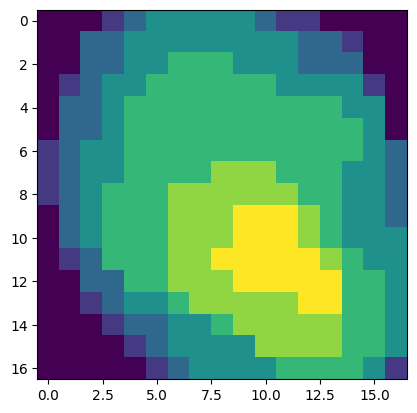

In [44]:
import matplotlib.pyplot as plt
big_mask=np.sum(mask_3d,axis=2)
plt.imshow(big_mask)

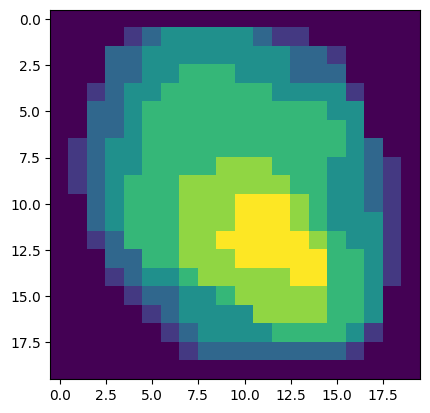

In [56]:
big_mask=np.sum(mask_3d,axis=2)
plt.imshow(big_mask[ymin-1:ymax+2, xmin-1:xmax+2])